# Time Series Data Analysis

## Imports

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from datetime import datetime, timedelta
import calendar

import os
from pathlib import Path

from pandas.errors import EmptyDataError

from tqdm import tqdm

import warnings

from download import download

## Path

In [2]:
path_root_dir = Path(os.getcwd()) #.parent
path_data = f'{path_root_dir}/data'
os.chdir(path_root_dir)

In [3]:
print(f'Root path: {path_root_dir}')
print(f'Data path: {path_data}')

Root path: /Users/bobby/Documents/data_science/projects/templates
Data path: /Users/bobby/Documents/data_science/projects/templates/data


## Parameters

In [4]:
path = download('https://archive.ics.uci.edu/ml/machine-learning-databases/00501/PRSA2017_Data_20130301-20170228.zip', '/tmp/aq', kind='zip')

warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['axes.grid'] = False

Replace is False and data exists, so doing nothing. Use replace=True to re-download the data.


In [5]:
instrument = 'eurusd'
start_date = '2023-01-01'
end_date = '2023-07-01'

In [6]:
start_dt = datetime.strptime(start_date, '%Y-%m-%d')
end_dt = datetime.strptime(end_date, '%Y-%m-%d')
start_year = int(start_date.split('-')[0])
end_year = int(end_date.split('-')[0])

In [7]:
# years
years_list = [year for year in range(start_year, end_year + 1)]

# months
month_names = []
current_dt = start_dt
while current_dt <= end_dt:
    month_names.append(calendar.month_name[current_dt.month])
    current_dt += timedelta(days=32)
month_names.append(calendar.month_name[current_dt.month])
temp_list = [i+1 for i in range(len(month_names))]
month_num_list = []
for val in temp_list:
    if val > 12:
        break
    if val < 10:
        month_num_list.append(f'0{val}')
    else:
        month_num_list.append(f'{val}')
month_names_list = []
for i in range(len(month_names)):
    if i > 11:
        break
    else:
        month_names_list.append(f'{month_names[i][:3].lower()}')
months_list = list(zip(month_names_list, month_num_list))

# days
days = [i+1 for i in range(31)]
days_list = []
for val in days:
    if val < 10:
        days_list.append(f'0{val}')
    else:
        days_list.append(f'{val}')

## Data

In [ ]:
# CAN BE DONE WITH THIS TS DATASET
# df = pd.read_csv('/tmp/aq/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv', encoding='ISO-8859-1')

In [8]:
data = pd.DataFrame()

for year in years_list:
    for month_name, month_num in months_list:
        for day in tqdm(days_list, desc='Processing'):
            if f'{year}-{month_num}-{day}' >= end_date:
                break
            if month_name in ['apr', 'jun', 'sep', 'nov'] and int(day) > 30:
                continue
            if month_name == 'feb' and int(day) > 28:
                continue
            try:
                data = pd.concat([data, pd.read_csv(f'{path_data}/{instrument}/{year}/{month_name}/{instrument.upper()}_Ticks_{day}.{month_num}.{year}-{day}.{month_num}.{year}.csv')])
            except EmptyDataError:
                data = pd.concat([data, pd.DataFrame(data={'Gmt time': [f'{day}.{month_num}.{year} 00:00:00.001'], 'Ask': [0.0], 'Bid': [0.0], 'AskVolume': [0.0], 'BidVolume': [0.0]})])


Processing:   0%|          | 0/31 [00:00<?, ?it/s]


In [9]:
df_ticks = data.copy()

In [10]:
df_ticks.head()

,Gmt time,Ask,Bid,AskVolume,BidVolume
0,01.01.2023 22:04:01.067,1.07092,1.06970,899999.9762,899999.9762
1,01.01.2023 22:04:38.111,1.07092,1.06974,899999.9762,899999.9762
2,01.01.2023 22:04:44.112,1.07092,1.06970,899999.9762,899999.9762
3,01.01.2023 22:04:45.871,1.07092,1.06974,899999.9762,899999.9762
4,01.01.2023 22:04:46.551,1.07092,1.06970,899999.9762,899999.9762


## Exploration

In [14]:
df_ticks.info()

<class 'pandas.core.frame.DataFrame'>
Index: 15205443 entries, 0 to 103718
Data columns (total 5 columns):
 #   Column     Dtype  
---  ------     -----  
 0   Gmt time   object 
 1   Ask        float64
 2   Bid        float64
 3   AskVolume  float64
 4   BidVolume  float64
dtypes: float64(4), object(1)
memory usage: 696.0+ MB


In [15]:
df_ticks.describe()

,Ask,Bid,AskVolume,BidVolume
count,1.520544e+07,1.520544e+07,1.520544e+07,1.520544e+07
mean,1.079367e+00,1.079326e+00,2.909800e+06,3.082882e+06
std,1.382404e-02,1.383021e-02,2.407418e+06,2.452103e+06
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,1.068660e+00,1.068610e+00,9.000000e+05,9.000000e+05
50%,1.079020e+00,1.078980e+00,2.270000e+06,3.600000e+06
75%,1.090450e+00,1.090410e+00,4.500000e+06,4.500000e+06
max,1.109570e+00,1.109520e+00,2.807000e+07,6.381000e+07


In [16]:
df_ticks['Gmt time'] = pd.to_datetime(df_ticks['Gmt time'], format='%d.%m.%Y %H:%M:%S.%f')

In [17]:
df_ticks = df_ticks.rename(columns={'Gmt time': 'date_time'}).set_index('date_time')

In [18]:
df_ticks.index

DatetimeIndex(['2023-01-01 22:04:01.067000', '2023-01-01 22:04:38.111000',
               '2023-01-01 22:04:44.112000', '2023-01-01 22:04:45.871000',
               '2023-01-01 22:04:46.551000', '2023-01-01 22:05:02.426000',
               '2023-01-01 22:05:02.477000', '2023-01-01 22:05:02.541000',
               '2023-01-01 22:05:15.531000', '2023-01-01 22:05:42.671000',
               ...
               '2023-06-30 20:59:04.638000', '2023-06-30 20:59:04.787000',
               '2023-06-30 20:59:10.600000', '2023-06-30 20:59:24.036000',
               '2023-06-30 20:59:30.210000', '2023-06-30 20:59:32.947000',
               '2023-06-30 20:59:56.188000', '2023-06-30 20:59:56.290000',
               '2023-06-30 20:59:57.511000', '2023-06-30 20:59:57.926000'],
              dtype='datetime64[ns]', name='date_time', length=15205443, freq=None)

In [32]:
# FOR MORE INSIGTHS IT CAN BE DONE WITH GROUPPING
df_ticks['month'] = df_ticks.index.month
display(df_ticks[['month', 'Ask']].groupby('month').describe())
df_ticks = df_ticks.drop('month', axis=1)

Ask                                                             
           count      mean       std  min      25%      50%      75%      max
month                                                                        
1      2971542.0  1.076428  0.011692  0.0  1.06789  1.08097  1.08560  1.09298
2      2687214.0  1.071957  0.011101  0.0  1.06487  1.07022  1.07550  1.10336
3      3376683.0  1.069958  0.010332  0.0  1.06140  1.06822  1.07698  1.09300
4      1881563.0  1.096550  0.006161  0.0  1.09212  1.09697  1.10117  1.10957
5      2236719.0  1.087230  0.012074  0.0  1.07709  1.08653  1.09855  1.10919
6      2051722.0  1.084486  0.009642  0.0  1.07601  1.08721  1.09245  1.10124

In [ ]:
# JUST A QUICK OVERVIEW OF THE FEATURE
df_ticks['Ask'].plot(grid=True) # .hist()

In [ ]:
# JUST A QUICK OVERVIEW OF THE FEATURE
df_ticks['Bid'].plot(grid=True) # .hist()

In [ ]:
# JUST A QUICK OVERVIEW OF THE FEATURE
df_ticks['AskVolume'].plot(grid=True) # .hist()

In [ ]:
# JUST A QUICK OVERVIEW OF THE FEATURE
df_ticks['BidVolume'].plot(grid=True) # .hist()

There are several anomalies in volumes features. Bid and Ask look weird because there are 0 values for Saturdays (also relatively few values for Sundays)

array([<Axes: xlabel='date_time'>, <Axes: xlabel='date_time'>],
      dtype=object)

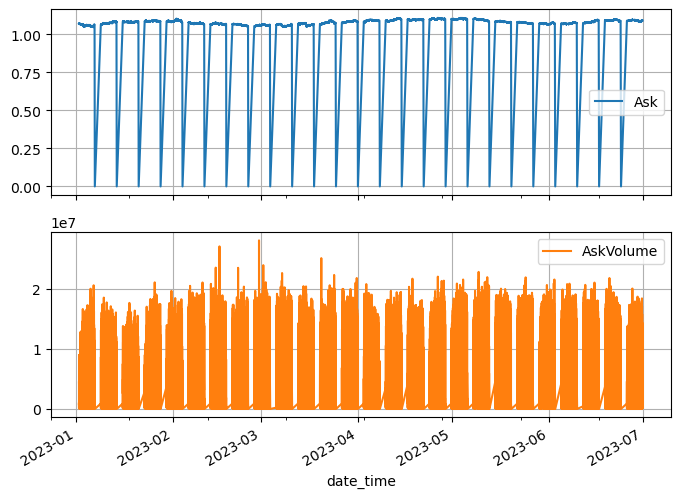

In [33]:
# SOME MORE DEPENDESCIES BETWEEN FEATURES
df_ticks[['Ask', 'AskVolume']].plot(grid=True, subplots=True)

array([<Axes: xlabel='date_time'>, <Axes: xlabel='date_time'>],
      dtype=object)

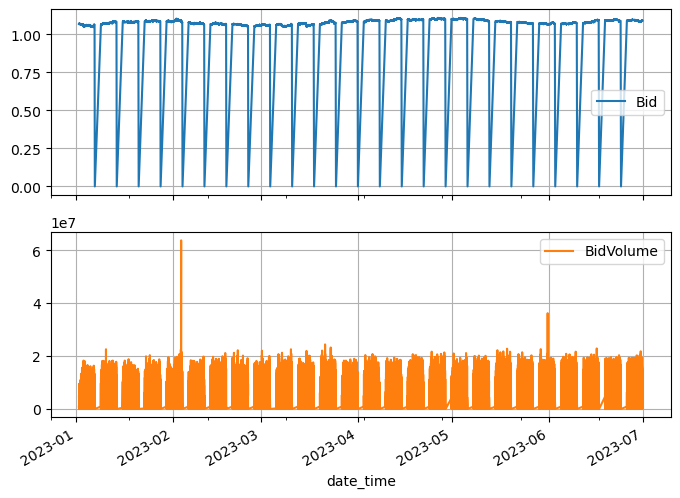

In [34]:
# SOME MORE DEPENDESCIES BETWEEN FEATURES
df_ticks[['Bid', 'BidVolume']].plot(grid=True, subplots=True)

<Axes: ylabel='Density'>

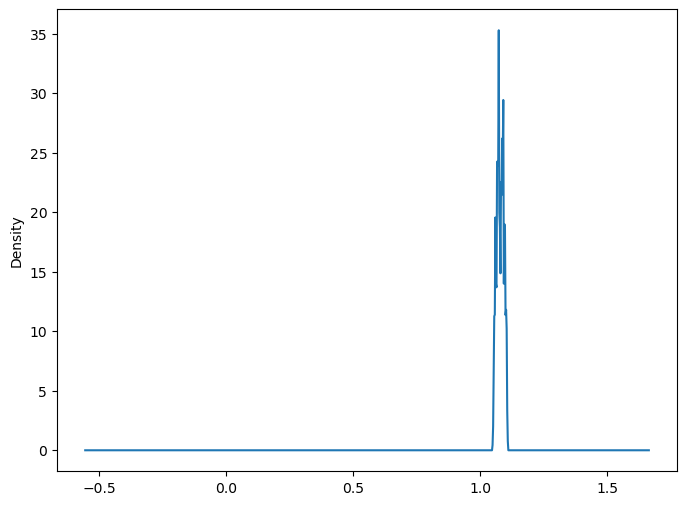

In [35]:
# JUST TO UNDERSTAND HOW THE DATA ARE DISTRIBUTED DURING THE TIME
df_ticks['Ask'].plot(kind='density')

<Axes: ylabel='Density'>

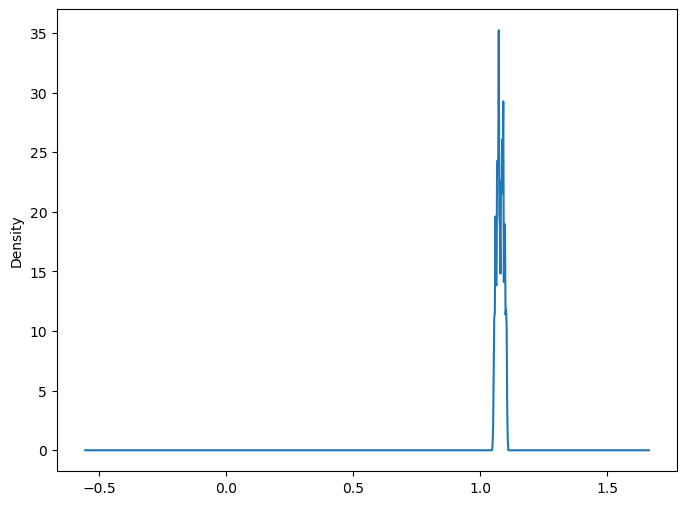

In [36]:
# JUST TO UNDERSTAND HOW THE DATA ARE DISTRIBUTED DURING THE TIME
df_ticks['Bid'].plot(kind='density')

<Axes: ylabel='Density'>

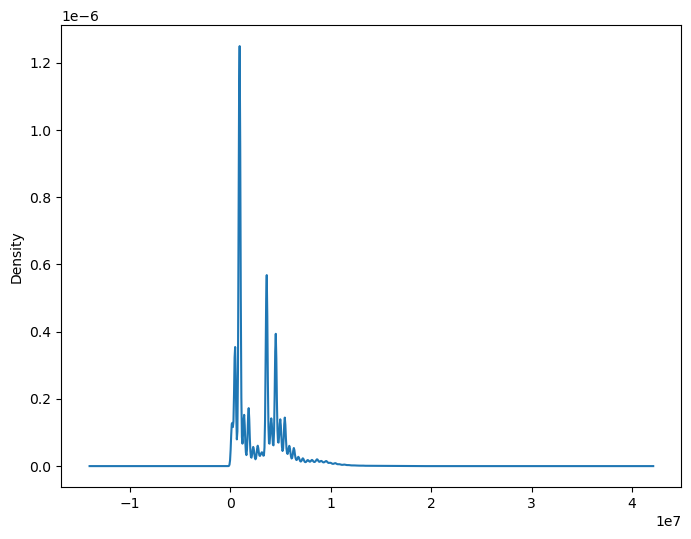

In [37]:
# JUST TO UNDERSTAND HOW THE DATA ARE DISTRIBUTED DURING THE TIME
df_ticks['AskVolume'].plot(kind='density')

<Axes: ylabel='Density'>

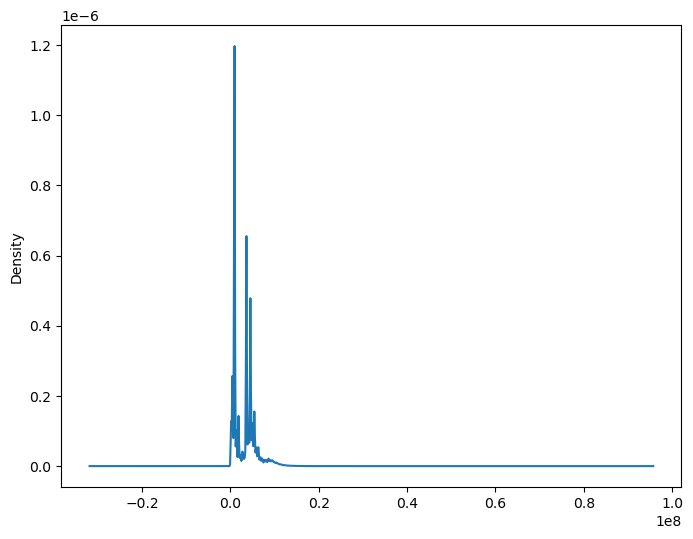

In [38]:
# JUST TO UNDERSTAND HOW THE DATA ARE DISTRIBUTED DURING THE TIME
df_ticks['BidVolume'].plot(kind='density')

In [ ]:
# FOR VISUALIZATION WITH SLIDER

# fig = px.line(df_ticks, y='Ask', title='Ask price')
# fig.update_xaxes(rangeslider_visible=True)
# fig.show()

In [ ]:
# FOR VISUALIZATION WITH SLIDER (SOME A LITTLE BIT MORE ADVANCED WITH BUTTONS)

# fig = px.line(df_ticks, y='Ask', title='Ask price')
# fig.update_xaxes(
#     rangeslider_visible=True,
#     rangeselector=dict(
#         buttons=list(
#             [
#                 dict(count=1, label='1m', step='month', stepmode='backward'),
#                 dict(count=2, label='2m', step='month', stepmode='backward'),
#                 dict(count=3, label='3m', step='month', stepmode='backward'),
#                 dict(count=4, label='1y', step='year', stepmode='backward'),
#                 dict(count=5, label='2y', step='year', stepmode='backward'),
#                 dict(count=6, label='3y', step='year', stepmode='backward'),
#                 dict(step='all')
#             ]
#         )
#     )
# )
# fig.show()

<Axes: xlabel='y(t)', ylabel='y(t + 1)'>

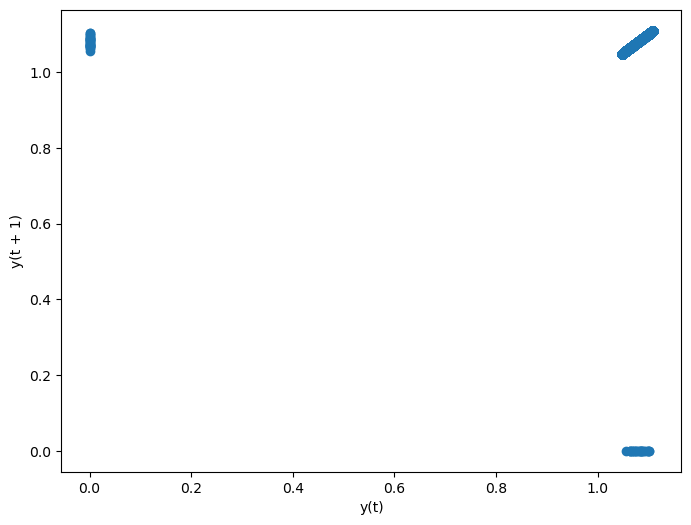

In [39]:
# CHECK THE RELATIONSHIPS DURING CURRENT AND THE NEXT TIME STAMP
pd.plotting.lag_plot(df_ticks['Ask'], lag=1)

<Axes: xlabel='y(t)', ylabel='y(t + 1)'>

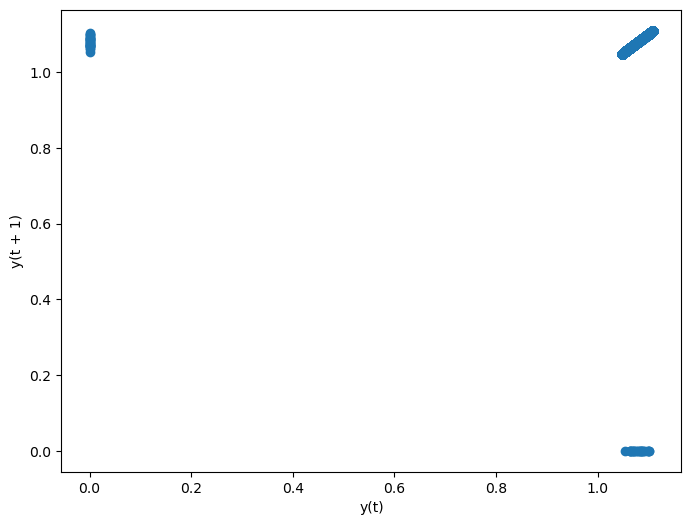

In [40]:
# CHECK THE RELATIONSHIPS DURING CURRENT AND THE NEXT TIME STAMP
pd.plotting.lag_plot(df_ticks['Bid'], lag=1)

<Axes: xlabel='y(t)', ylabel='y(t + 1)'>

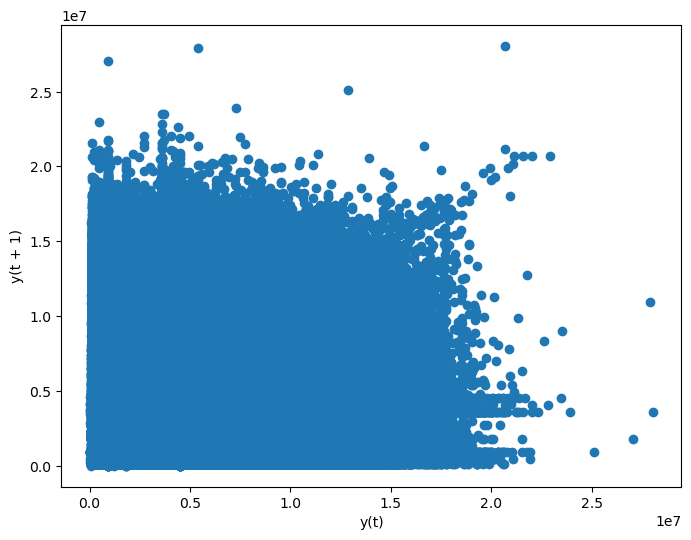

In [41]:
# CHECK THE RELATIONSHIPS DURING CURRENT AND THE NEXT TIME STAMP
pd.plotting.lag_plot(df_ticks['AskVolume'], lag=1)

<Axes: xlabel='y(t)', ylabel='y(t + 1)'>

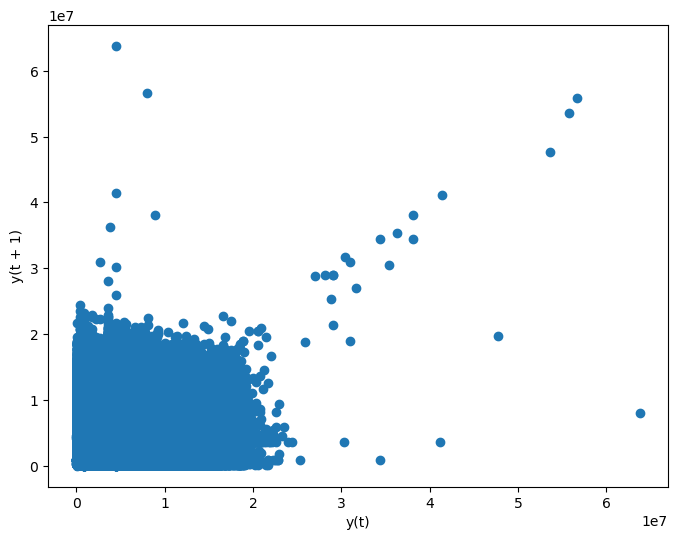

In [42]:
# CHECK THE RELATIONSHIPS DURING CURRENT AND THE NEXT TIME STAMP
pd.plotting.lag_plot(df_ticks['BidVolume'], lag=1)

In [ ]:
# sns.pairplots(df_ticks['Ask']) # doesn't effective in this situation

In [45]:
# pd.plotting.autocorrelation_plot(df_ticks['Ask'])

In [ ]:
# pd.plotting.autocorrelation_plot(df_ticks['Ask'].resemple('1M').mean())

# Handling Missing Values 

## Imports

In [46]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from datetime import datetime, timedelta

import os

import warnings

from download import download

## Parameters

In [47]:
path = download('https://archive.ics.uci.edu/ml/machine-learning-databases/00501/PRSA2017_Data_20130301-20170228.zip', '/tmp/aq', kind='zip')

warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['axes.grid'] = False

Replace is False and data exists, so doing nothing. Use replace=True to re-download the data.


## Data

In [48]:
def convert_to_date(x):
    return datetime.strptime(x, '%Y %m %d %H')
df = pd.read_csv('/tmp/aq/PRSA_Data_20130301-20170228/PRSA_Data_Dingling_20130301-20170228.csv', 
                 parse_dates=[['year', 'month', 'day', 'hour']], 
                 date_parser=convert_to_date)

In [49]:
df.head()

,year_month_day_hour,No,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
0,2013-03-01 00:00:00,1,4.0,4.0,3.0,NaN,200.0,82.0,-2.3,1020.8,-19.7,0.0,E,0.5,Dingling
1,2013-03-01 01:00:00,2,7.0,7.0,3.0,NaN,200.0,80.0,-2.5,1021.3,-19.0,0.0,ENE,0.7,Dingling
2,2013-03-01 02:00:00,3,5.0,5.0,3.0,2.0,200.0,79.0,-3.0,1021.3,-19.9,0.0,ENE,0.2,Dingling
3,2013-03-01 03:00:00,4,6.0,6.0,3.0,NaN,200.0,79.0,-3.6,1021.8,-19.1,0.0,NNE,1.0,Dingling
4,2013-03-01 04:00:00,5,5.0,5.0,3.0,NaN,200.0,81.0,-3.5,1022.3,-19.4,0.0,N,2.1,Dingling


## Exploration

In [50]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35064 entries, 0 to 35063
Data columns (total 15 columns):
 #   Column               Non-Null Count  Dtype         
---  ------               --------------  -----         
 0   year_month_day_hour  35064 non-null  datetime64[ns]
 1   No                   35064 non-null  int64         
 2   PM2.5                34285 non-null  float64       
 3   PM10                 34408 non-null  float64       
 4   SO2                  34334 non-null  float64       
 5   NO2                  33830 non-null  float64       
 6   CO                   33052 non-null  float64       
 7   O3                   33850 non-null  float64       
 8   TEMP                 35011 non-null  float64       
 9   PRES                 35014 non-null  float64       
 10  DEWP                 35011 non-null  float64       
 11  RAIN                 35013 non-null  float64       
 12  wd                   34924 non-null  object        
 13  WSPM                 35021 non-

In [51]:
df.describe()

,year_month_day_hour,No,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,WSPM
count,35064,35064.000000,34285.000000,34408.000000,34334.000000,33830.000000,33052.000000,33850.000000,35011.000000,35014.000000,35011.000000,35013.000000,35021.000000
mean,2015-03-01 11:30:00,17532.500000,65.989497,83.739723,11.749650,27.585467,904.896073,68.548371,13.686111,1007.760278,1.505495,0.060366,1.853836
min,2013-03-01 00:00:00,1.000000,3.000000,2.000000,0.285600,1.026500,100.000000,0.214200,-16.600000,982.400000,-35.100000,0.000000,0.000000
25%,2014-03-01 05:45:00,8766.750000,14.000000,26.000000,2.000000,9.000000,300.000000,31.000000,3.400000,999.300000,-10.200000,0.000000,1.000000
50%,2015-03-01 11:30:00,17532.500000,41.000000,60.000000,5.000000,19.000000,600.000000,61.000000,14.700000,1007.400000,1.800000,0.000000,1.500000
75%,2016-02-29 17:15:00,26298.250000,93.000000,117.000000,15.000000,38.000000,1200.000000,90.000000,23.300000,1016.000000,14.200000,0.000000,2.300000
max,2017-02-28 23:00:00,35064.000000,881.000000,905.000000,156.000000,205.000000,10000.000000,500.000000,41.400000,1036.500000,27.200000,52.100000,10.000000
std,NaN,10122.249256,72.267723,79.541685,15.519259,26.383882,903.306220,53.764424,11.365313,10.225664,13.822099,0.752899,1.309808


In [58]:
df.isnull().sum()

year_month_day_hour       0
No                        0
PM2.5                   779
PM10                    656
SO2                     730
NO2                    1234
CO                     2012
O3                     1214
TEMP                     53
PRES                     50
DEWP                     53
RAIN                     51
wd                      140
WSPM                     43
station                   0
dtype: int64

In [68]:
df.query('TEMP != TEMP') # df[df['TEMP'].isnull()]

,year_month_day_hour,No,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
16748,2015-01-27 20:00:00,16749,39.0,43.0,28.0,34.0,1100.0,23.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
16813,2015-01-30 13:00:00,16814,15.0,19.0,19.0,5.0,400.0,68.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
16829,2015-01-31 05:00:00,16830,5.0,11.0,32.0,8.0,400.0,60.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
16873,2015-02-02 01:00:00,16874,60.0,60.0,30.0,39.0,2600.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
16883,2015-02-02 11:00:00,16884,138.0,138.0,52.0,73.0,2200.0,14.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
16930,2015-02-04 10:00:00,16931,8.0,8.0,13.0,5.0,200.0,69.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
16933,2015-02-04 13:00:00,16934,13.0,16.0,14.0,3.0,300.0,68.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
17007,2015-02-07 15:00:00,17008,3.0,24.0,2.0,2.0,200.0,88.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
17030,2015-02-08 14:00:00,17031,4.0,5.0,7.0,2.0,200.0,80.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
17052,2015-02-09 12:00:00,17053,87.0,87.0,82.0,53.0,1600.0,27.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling


In [69]:
df.query('TEMP != TEMP').count()

year_month_day_hour    53
No                     53
PM2.5                  53
PM10                   53
SO2                    53
NO2                    53
CO                     53
O3                     53
TEMP                    0
PRES                    3
DEWP                    0
RAIN                    3
wd                     10
WSPM                   10
station                53
dtype: int64

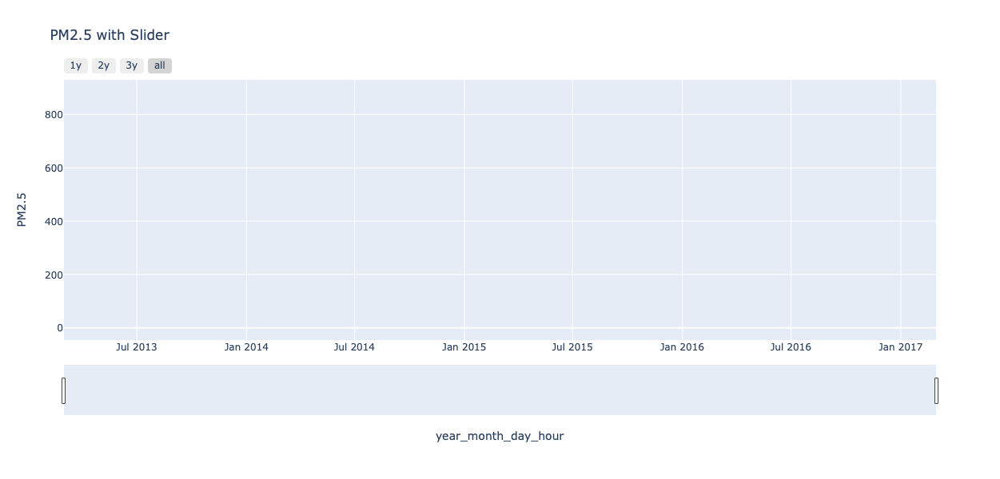

In [75]:
fig = px.line(df, x='year_month_day_hour', y='PM2.5', title='PM2.5 with Slider')
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list(
            [
                dict(count=1, label='1y', step='year', stepmode='backward'),
                dict(count=2, label='2y', step='year', stepmode='backward'),
                dict(count=3, label='3y', step='year', stepmode='backward'),
                dict(step='all')
            ]
        )
    )
)
fig.update_layout(height=600, width=1200)
fig.show()

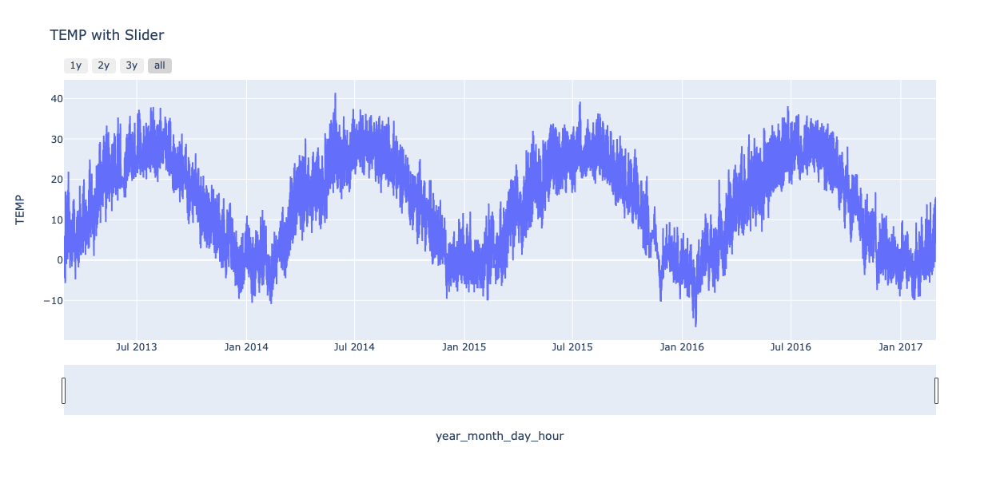

In [74]:
fig = px.line(df, x='year_month_day_hour', y='TEMP', title='TEMP with Slider')
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list(
            [
                dict(count=1, label='1y', step='year', stepmode='backward'),
                dict(count=2, label='2y', step='year', stepmode='backward'),
                dict(count=3, label='3y', step='year', stepmode='backward'),
                dict(step='all')
            ]
        )
    )
)
fig.update_layout(height=600, width=1200)
fig.show()

In [77]:
df = df.set_index('year_month_day_hour')

In [78]:
# ONLY FOR CONTINIOUS INDEX
df.loc['2015-02-02':'2015-02-04']

,No,PM2.5,PM10,SO2,NO2,CO,O3,TEMP,PRES,DEWP,RAIN,wd,WSPM,station
year_month_day_hour,,,,,,,,,,,,,,
2015-02-02 00:00:00,16873,67.0,67.0,32.0,40.0,2600.0,11.0,-4.0,1025.0,-19.5,0.0,NW,1.3,Dingling
2015-02-02 01:00:00,16874,60.0,60.0,30.0,39.0,2600.0,9.0,NaN,NaN,NaN,NaN,NaN,NaN,Dingling
2015-02-02 02:00:00,16875,65.0,65.0,17.0,46.0,2600.0,3.0,-6.0,1023.0,-19.7,0.0,NNW,0.1,Dingling
2015-02-02 03:00:00,16876,75.0,75.0,18.0,50.0,2900.0,3.0,-6.0,1023.0,-19.4,0.0,NNW,2.3,Dingling
2015-02-02 04:00:00,16877,96.0,96.0,19.0,53.0,3600.0,2.0,-6.0,1023.0,-19.0,0.0,NW,1.5,Dingling
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2015-02-04 19:00:00,16940,4.0,20.0,2.0,2.0,200.0,88.0,3.0,1023.0,-15.2,0.0,NNW,4.0,Dingling
2015-02-04 20:00:00,16941,5.0,12.0,3.0,2.0,200.0,87.0,2.0,1026.0,-15.5,0.0,NNW,3.5,Dingling
2015-02-04 21:00:00,16942,5.0,7.0,3.0,2.0,200.0,84.0,2.0,1022.0,-14.6,0.0,N,3.1,Dingling


In [79]:
df_na = df.copy()
df_na = df_na.dropna() # subset for dropping based on specific column

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

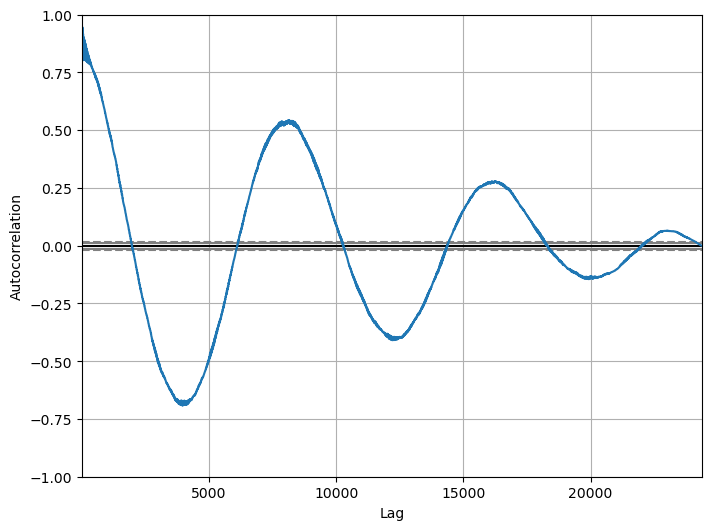

In [80]:
pd.plotting.autocorrelation_plot(df_na['2014':'2016']['TEMP'])

<Axes: xlabel='Lag', ylabel='Autocorrelation'>

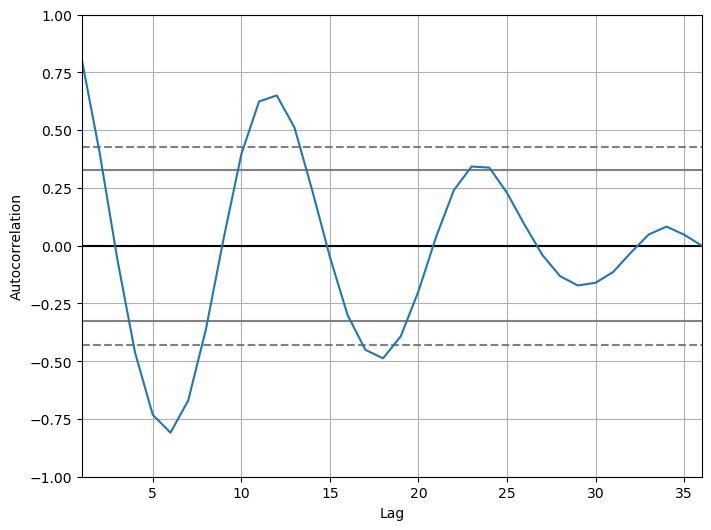

In [81]:
pd.plotting.autocorrelation_plot(df_na['2014':'2016']['TEMP'].resample('1m').mean())

<Axes: xlabel='y(t)', ylabel='y(t + 1)'>

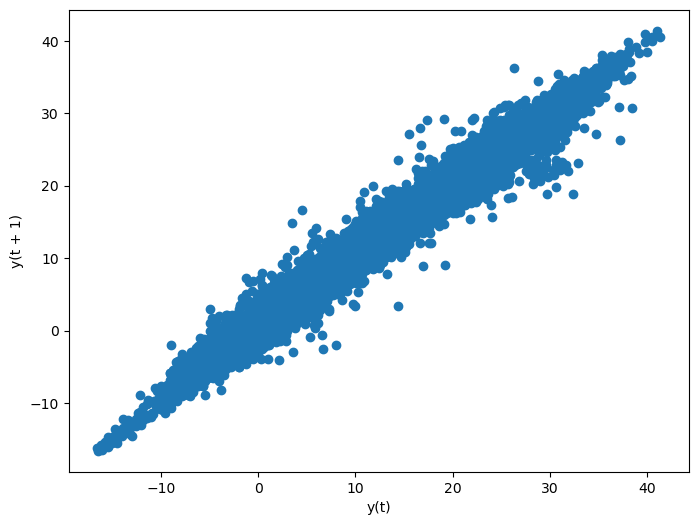

In [82]:
pd.plotting.lag_plot(df_na['TEMP'], lag=1)

<Axes: xlabel='y(t)', ylabel='y(t + 3)'>

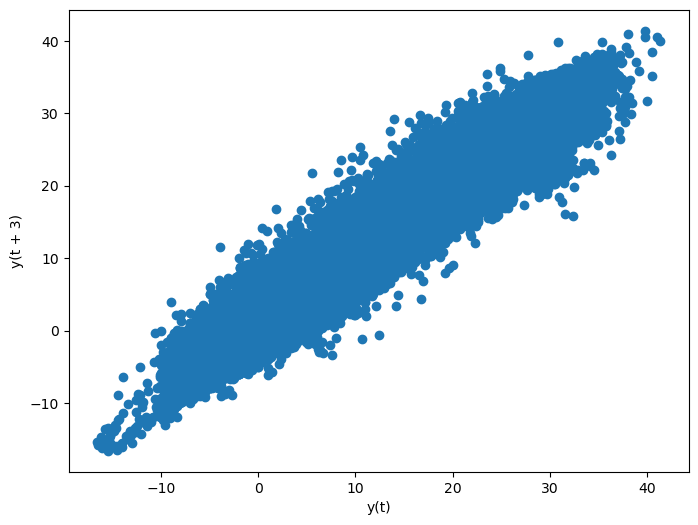

In [83]:
pd.plotting.lag_plot(df_na['TEMP'], lag=3)

<Axes: xlabel='y(t)', ylabel='y(t + 24)'>

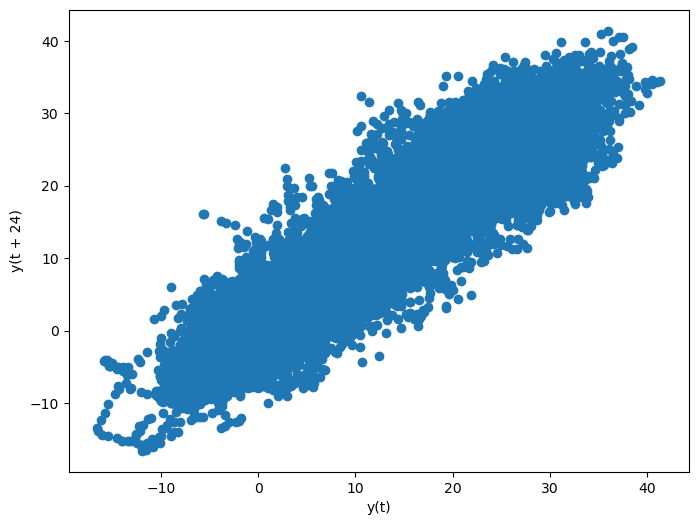

In [84]:
pd.plotting.lag_plot(df_na['TEMP'], lag=24)

<Axes: xlabel='y(t)', ylabel='y(t + 8640)'>

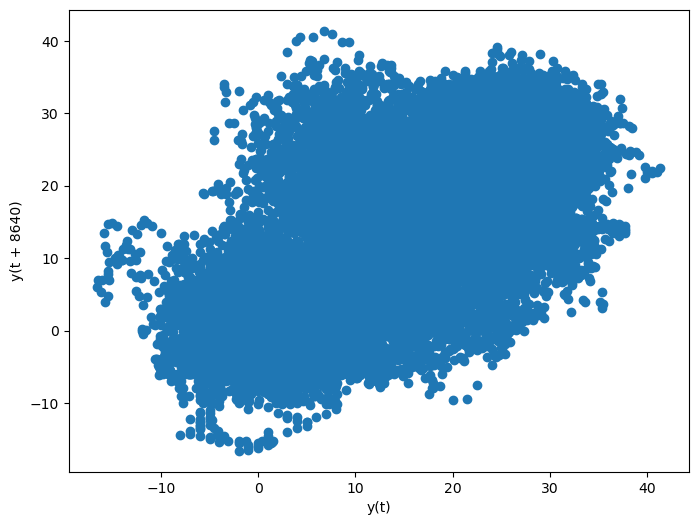

In [85]:
pd.plotting.lag_plot(df_na['TEMP'], lag=8640)

In [86]:
df_imp = df['2015-02-21 10': '2015-02-21 23'][['TEMP']]

In [87]:
df_imp

,TEMP
year_month_day_hour,
2015-02-21 10:00:00,1.0
2015-02-21 11:00:00,1.0
2015-02-21 12:00:00,NaN
2015-02-21 13:00:00,2.0
2015-02-21 14:00:00,NaN
2015-02-21 15:00:00,4.0
2015-02-21 16:00:00,4.0
2015-02-21 17:00:00,3.0
2015-02-21 18:00:00,2.0


In [89]:
df_imp['TEMP_FFILL'] = df_imp['TEMP'].fillna(method='ffill')

In [90]:
df_imp

,TEMP,TEMP_FFILL
year_month_day_hour,,
2015-02-21 10:00:00,1.0,1.0
2015-02-21 11:00:00,1.0,1.0
2015-02-21 12:00:00,NaN,1.0
2015-02-21 13:00:00,2.0,2.0
2015-02-21 14:00:00,NaN,2.0
2015-02-21 15:00:00,4.0,4.0
2015-02-21 16:00:00,4.0,4.0
2015-02-21 17:00:00,3.0,3.0
2015-02-21 18:00:00,2.0,2.0


In [91]:
df_imp['TEMP_BFILL'] = df_imp['TEMP'].fillna(method='bfill')

In [92]:
df_imp

,TEMP,TEMP_FFILL,TEMP_BFILL
year_month_day_hour,,,
2015-02-21 10:00:00,1.0,1.0,1.0
2015-02-21 11:00:00,1.0,1.0,1.0
2015-02-21 12:00:00,NaN,1.0,2.0
2015-02-21 13:00:00,2.0,2.0,2.0
2015-02-21 14:00:00,NaN,2.0,4.0
2015-02-21 15:00:00,4.0,4.0,4.0
2015-02-21 16:00:00,4.0,4.0,4.0
2015-02-21 17:00:00,3.0,3.0,3.0
2015-02-21 18:00:00,2.0,2.0,2.0


In [93]:
df_imp['TEMP'].rolling(window=2, min_periods=1).mean()

year_month_day_hour
2015-02-21 10:00:00    1.0
2015-02-21 11:00:00    1.0
2015-02-21 12:00:00    1.0
2015-02-21 13:00:00    2.0
2015-02-21 14:00:00    2.0
2015-02-21 15:00:00    4.0
2015-02-21 16:00:00    4.0
2015-02-21 17:00:00    3.5
2015-02-21 18:00:00    2.5
2015-02-21 19:00:00    1.5
2015-02-21 20:00:00    1.0
2015-02-21 21:00:00   -1.0
2015-02-21 22:00:00   -1.0
2015-02-21 23:00:00   -1.5
Name: TEMP, dtype: float64

In [94]:
df_imp['TEMP_ROLLING'] = df_imp['TEMP'].rolling(window=2, min_periods=1).mean()

In [95]:
df_imp

,TEMP,TEMP_FFILL,TEMP_BFILL,TEMP_ROLLING
year_month_day_hour,,,,
2015-02-21 10:00:00,1.0,1.0,1.0,1.0
2015-02-21 11:00:00,1.0,1.0,1.0,1.0
2015-02-21 12:00:00,NaN,1.0,2.0,1.0
2015-02-21 13:00:00,2.0,2.0,2.0,2.0
2015-02-21 14:00:00,NaN,2.0,4.0,2.0
2015-02-21 15:00:00,4.0,4.0,4.0,4.0
2015-02-21 16:00:00,4.0,4.0,4.0,4.0
2015-02-21 17:00:00,3.0,3.0,3.0,3.5
2015-02-21 18:00:00,2.0,2.0,2.0,2.5


In [98]:
df.loc[df_imp.index + pd.offsets.DateOffset(years=-1)]['TEMP']

year_month_day_hour
2014-02-21 10:00:00    1.4
2014-02-21 11:00:00    2.4
2014-02-21 12:00:00    3.0
2014-02-21 13:00:00    3.8
2014-02-21 14:00:00    3.5
2014-02-21 15:00:00    3.6
2014-02-21 16:00:00    3.3
2014-02-21 17:00:00    2.8
2014-02-21 18:00:00    1.3
2014-02-21 19:00:00    0.7
2014-02-21 20:00:00    1.2
2014-02-21 21:00:00    1.1
2014-02-21 22:00:00    0.7
2014-02-21 23:00:00    0.6
Name: TEMP, dtype: float64

In [99]:
df_imp = df_imp.reset_index()

In [100]:
df_imp

,year_month_day_hour,TEMP,TEMP_FFILL,TEMP_BFILL,TEMP_ROLLING
0,2015-02-21 10:00:00,1.0,1.0,1.0,1.0
1,2015-02-21 11:00:00,1.0,1.0,1.0,1.0
2,2015-02-21 12:00:00,NaN,1.0,2.0,1.0
3,2015-02-21 13:00:00,2.0,2.0,2.0,2.0
4,2015-02-21 14:00:00,NaN,2.0,4.0,2.0
5,2015-02-21 15:00:00,4.0,4.0,4.0,4.0
6,2015-02-21 16:00:00,4.0,4.0,4.0,4.0
7,2015-02-21 17:00:00,3.0,3.0,3.0,3.5
8,2015-02-21 18:00:00,2.0,2.0,2.0,2.5
9,2015-02-21 19:00:00,1.0,1.0,1.0,1.5


In [101]:
df_imp['TEMP_PREVY'] = df_imp.apply(lambda x: df.loc[x['year_month_day_hour'] - pd.offsets.DateOffset(years=-1)]['TEMP'] if pd.isna(x['TEMP']) else x['TEMP'], axis=1)

In [102]:
df_imp

,year_month_day_hour,TEMP,TEMP_FFILL,TEMP_BFILL,TEMP_ROLLING,TEMP_PREVY
0,2015-02-21 10:00:00,1.0,1.0,1.0,1.0,1.0
1,2015-02-21 11:00:00,1.0,1.0,1.0,1.0,1.0
2,2015-02-21 12:00:00,NaN,1.0,2.0,1.0,1.9
3,2015-02-21 13:00:00,2.0,2.0,2.0,2.0,2.0
4,2015-02-21 14:00:00,NaN,2.0,4.0,2.0,4.9
5,2015-02-21 15:00:00,4.0,4.0,4.0,4.0,4.0
6,2015-02-21 16:00:00,4.0,4.0,4.0,4.0,4.0
7,2015-02-21 17:00:00,3.0,3.0,3.0,3.5,3.0
8,2015-02-21 18:00:00,2.0,2.0,2.0,2.5,2.0
9,2015-02-21 19:00:00,1.0,1.0,1.0,1.5,1.0


# Moving Averages (works only for stationary and constant TS)

## Imports

In [105]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from datetime import datetime, timedelta

import os

import warnings

## Parameters

In [106]:
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['axes.grid'] = False

## Data

In [107]:
def convert_to_date(x):
    return datetime.strptime(x, '%m/%d/%Y')

df = pd.read_csv('https://raw.githubusercontent.com/srivatsan88/YouTubeLI/master/dataset/electricity_consumption.csv', 
                 parse_dates=['Bill_Date'], date_parser=convert_to_date)

In [108]:
df.head()

,Bill_Date,On_peak,Off_peak,Usage_charge,Billed_amount,Billing_days
0,2016-01-01,365,1423.5,219.0,247.73,31
1,2016-02-01,292,1138.8,175.2,234.11,31
2,2016-03-01,130,507.0,78.0,123.85,29
3,2016-04-01,117,456.3,70.2,111.22,29
4,2016-05-01,136,530.4,81.6,118.37,29


## Exploration

In [109]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53 entries, 0 to 52
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Bill_Date      53 non-null     datetime64[ns]
 1   On_peak        53 non-null     int64         
 2   Off_peak       53 non-null     float64       
 3   Usage_charge   53 non-null     float64       
 4   Billed_amount  53 non-null     float64       
 5   Billing_days   53 non-null     int64         
dtypes: datetime64[ns](1), float64(3), int64(2)
memory usage: 2.6 KB


In [110]:
df.describe()

,Bill_Date,On_peak,Off_peak,Usage_charge,Billed_amount,Billing_days
count,53,53.000000,53.000000,53.000000,53.000000,53.000000
mean,2018-03-02 01:21:30.566037760,232.811321,1089.292453,175.957170,194.535094,30.207547
min,2016-01-01 00:00:00,63.000000,245.700000,37.800000,77.810000,25.000000
25%,2017-02-01 00:00:00,147.000000,777.000000,128.120000,145.460000,29.000000
50%,2018-03-01 00:00:00,211.000000,1103.000000,181.850000,193.490000,31.000000
75%,2019-04-01 00:00:00,316.000000,1353.300000,218.870000,244.030000,31.000000
max,2020-05-01 00:00:00,501.000000,2139.000000,371.610000,403.890000,34.000000
std,NaN,106.888162,411.011878,67.797382,68.951708,1.974438


In [113]:
df_bill = df.copy()

In [117]:
df_bill = df_bill.set_index('Bill_Date')

In [118]:
df_bill_2018 = df_bill.loc['2016':'2018'][['Billed_amount']]

In [119]:
df_bill_2018

,Billed_amount
Bill_Date,
2016-01-01,247.73
2016-02-01,234.11
2016-03-01,123.85
2016-04-01,111.22
2016-05-01,118.37
2016-06-01,77.81
2016-07-01,86.67
2016-08-01,122.40
2016-09-01,223.62


Simple moving average is (t + (t-1) + (t-2) + ... + (t - n)) / n

In [120]:
df_bill_2018['Billed_amount'].rolling(window=3).mean()

Bill_Date
2016-01-01           NaN
2016-02-01           NaN
2016-03-01    201.896667
2016-04-01    156.393333
2016-05-01    117.813333
2016-06-01    102.466667
2016-07-01     94.283333
2016-08-01     95.626667
2016-09-01    144.230000
2016-10-01    166.186667
2016-11-01    175.566667
2016-12-01    182.483333
2017-01-01    219.516667
2017-02-01    240.776667
2017-03-01    209.833333
2017-04-01    161.550000
2017-05-01    141.170000
2017-06-01    161.350000
2017-07-01    215.483333
2017-08-01    243.746667
2017-09-01    267.820000
2017-10-01    231.653333
2017-11-01    189.500000
2017-12-01    145.206667
2018-01-01    176.750000
2018-02-01    206.696667
2018-03-01    223.860000
2018-04-01    185.040000
2018-05-01    172.280000
2018-06-01    177.896667
2018-07-01    222.270000
2018-08-01    264.630000
2018-09-01    277.363333
2018-10-01    291.766667
2018-11-01    259.546667
2018-12-01    224.340000
Name: Billed_amount, dtype: float64

In [121]:
df_bill_2018['ma_rolling_3'] = df_bill_2018['Billed_amount'].rolling(window=3).mean().shift(1)

In [122]:
df_bill_2018

,Billed_amount,ma_rolling_3
Bill_Date,,
2016-01-01,247.73,NaN
2016-02-01,234.11,NaN
2016-03-01,123.85,NaN
2016-04-01,111.22,201.896667
2016-05-01,118.37,156.393333
2016-06-01,77.81,117.813333
2016-07-01,86.67,102.466667
2016-08-01,122.40,94.283333
2016-09-01,223.62,95.626667


<Axes: xlabel='Bill_Date'>

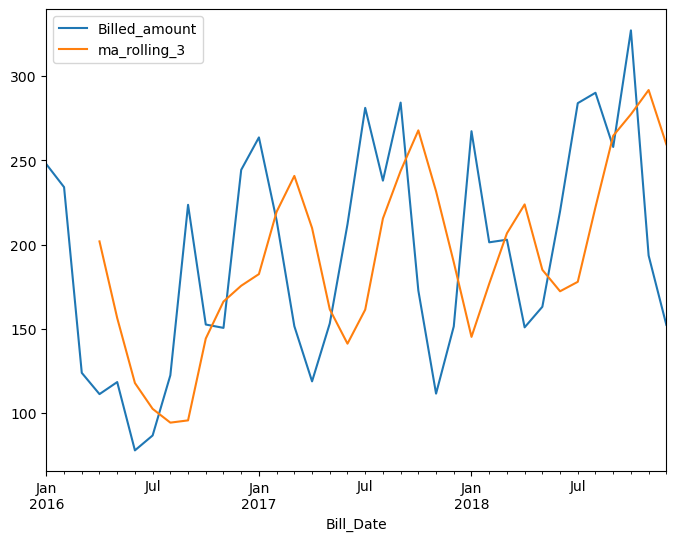

In [123]:
df_bill_2018.plot()

Weighted moving average is ((t * weight) + ((t-1) * weight -1 ) + ((t-2) * weight - 2) + ... + ((t - n) * weight - n)) / n

In [126]:
def wma(weights):
    def calc(x):
        return (weights * x).mean()
    return calc

In [143]:
df_bill_2018['Billed_amount'].rolling(window=3).apply(wma(np.array([0.5, 1, 1.5])))

Bill_Date
2016-01-01           NaN
2016-02-01           NaN
2016-03-01    181.250000
2016-04-01    135.911667
2016-05-01    116.900000
2016-06-01     96.898333
2016-07-01     89.000000
2016-08-01    103.058333
2016-09-01    167.055000
2016-10-01    171.210000
2016-11-01    163.386667
2016-12-01    197.788333
2017-01-01    238.366667
2017-02-01    235.768333
2017-03-01    191.150000
2017-04-01    145.628333
2017-05-01    141.443333
2017-06-01    176.898333
2017-07-01    236.818333
2017-08-01    248.061667
2017-09-01    268.338333
2017-10-01    220.773333
2017-11-01    160.701667
2017-12-01    141.661667
2018-01-01    202.718333
2018-02-01    215.018333
2018-03-01    213.125000
2018-04-01    176.625000
2018-05-01    165.640000
2018-06-01    189.380000
2018-07-01    242.421667
2018-08-01    276.361667
2018-09-01    273.026667
2018-10-01    297.940000
2018-11-01    248.801667
2018-12-01    195.198333
Name: Billed_amount, dtype: float64

In [144]:
df_bill_2018['wma_rolling_3'] = df_bill_2018['Billed_amount'].rolling(window=3).apply(wma(np.array([0.5, 1, 1.5]))).shift(1)

In [145]:
df_bill_2018

,Billed_amount,ma_rolling_3,wma_rolling_3,ewm_window_3
Bill_Date,,,,
2016-01-01,247.73,NaN,NaN,NaN
2016-02-01,234.11,NaN,NaN,247.730000
2016-03-01,123.85,NaN,NaN,240.920000
2016-04-01,111.22,201.896667,181.250000,182.385000
2016-05-01,118.37,156.393333,135.911667,146.802500
2016-06-01,77.81,117.813333,116.900000,132.586250
2016-07-01,86.67,102.466667,96.898333,105.198125
2016-08-01,122.40,94.283333,89.000000,95.934063
2016-09-01,223.62,95.626667,103.058333,109.167031


<Axes: xlabel='Bill_Date'>

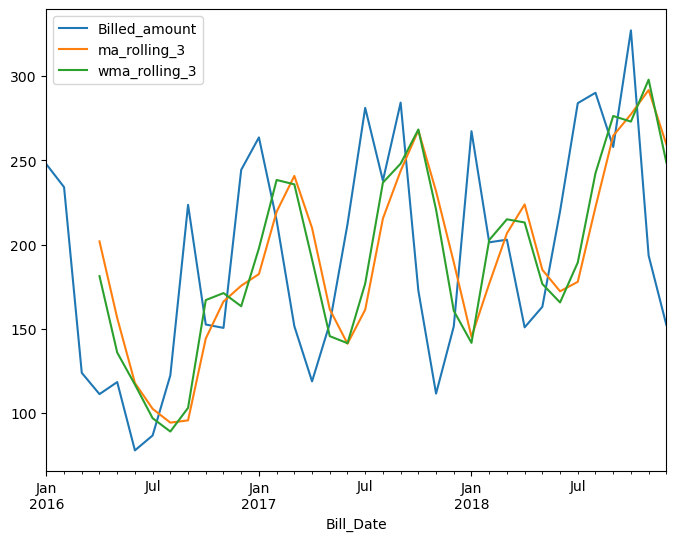

In [130]:
df_bill_2018.plot()

Exponential moving average is (Close - previous EMA) * (2 / (span + 1)) + previous EMA

In [135]:
df_bill_2018['Billed_amount'].ewm(span=3, adjust=False, min_periods=0).mean()

Bill_Date
2016-01-01    247.730000
2016-02-01    240.920000
2016-03-01    182.385000
2016-04-01    146.802500
2016-05-01    132.586250
2016-06-01    105.198125
2016-07-01     95.934063
2016-08-01    109.167031
2016-09-01    166.393516
2016-10-01    159.466758
2016-11-01    155.003379
2016-12-01    199.686689
2017-01-01    231.663345
2017-02-01    222.991672
2017-03-01    187.265836
2017-04-01    153.027918
2017-05-01    153.103959
2017-06-01    182.591980
2017-07-01    231.890990
2017-08-01    234.930495
2017-09-01    259.615247
2017-10-01    216.152624
2017-11-01    163.831312
2017-12-01    157.625656
2018-01-01    212.472828
2018-02-01    206.911414
2018-03-01    204.910707
2018-04-01    177.885353
2018-05-01    170.477677
2018-06-01    195.118838
2018-07-01    239.549419
2018-08-01    264.849710
2018-09-01    261.404855
2018-10-01    294.297427
2018-11-01    243.893714
2018-12-01    198.116857
Name: Billed_amount, dtype: float64

In [146]:
df_bill_2018['ewm_window_3'] = df_bill_2018['Billed_amount'].ewm(span=3, adjust=False, min_periods=0).mean().shift(1)

In [147]:
df_bill_2018

,Billed_amount,ma_rolling_3,wma_rolling_3,ewm_window_3
Bill_Date,,,,
2016-01-01,247.73,NaN,NaN,NaN
2016-02-01,234.11,NaN,NaN,247.730000
2016-03-01,123.85,NaN,NaN,240.920000
2016-04-01,111.22,201.896667,181.250000,182.385000
2016-05-01,118.37,156.393333,135.911667,146.802500
2016-06-01,77.81,117.813333,116.900000,132.586250
2016-07-01,86.67,102.466667,96.898333,105.198125
2016-08-01,122.40,94.283333,89.000000,95.934063
2016-09-01,223.62,95.626667,103.058333,109.167031


<Axes: xlabel='Bill_Date'>

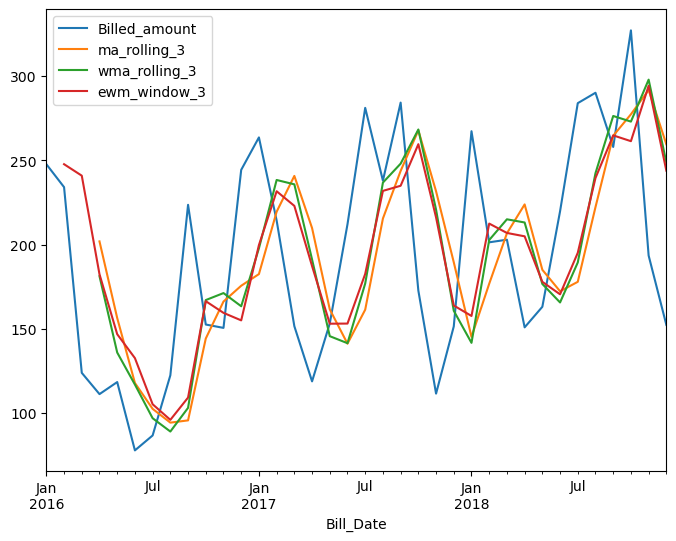

In [148]:
df_bill_2018.plot()

Exponential smoothing Y^hat_(t+1) = alpha[y_t + (1 - alpha) * Y_(t-1) + (1 - alpha)^2 * Y_(t-2) + (1 - alpha)^3 * Y_(t-3) + ...]

In [149]:
df_bill_2018['Billed_amount'].ewm(alpha=0.7, adjust=False, min_periods=3).mean()

Bill_Date
2016-01-01           NaN
2016-02-01           NaN
2016-03-01    158.153800
2016-04-01    125.300140
2016-05-01    120.449042
2016-06-01     90.601713
2016-07-01     87.849514
2016-08-01    112.034854
2016-09-01    190.144456
2016-10-01    163.821337
2016-11-01    154.524401
2016-12-01    217.416320
2017-01-01    249.772896
2017-02-01    224.955869
2017-03-01    173.564761
2017-04-01    135.222428
2017-05-01    147.792728
2017-06-01    192.793819
2017-07-01    254.671146
2017-08-01    242.980344
2017-09-01    271.904103
2017-10-01    202.454231
2017-11-01    138.793269
2017-12-01    147.631981
2018-01-01    231.413594
2018-02-01    210.369078
2018-03-01    205.147723
2018-04-01    167.146317
2018-05-01    164.292895
2018-06-01    203.119869
2018-07-01    259.721961
2018-08-01    281.021588
2018-09-01    264.878476
2018-10-01    308.496543
2018-11-01    227.991963
2018-12-01    175.035589
Name: Billed_amount, dtype: float64

In [150]:
df_bill_2018['esm_window_3_7'] = df_bill_2018['Billed_amount'].ewm(alpha=0.7, adjust=False, min_periods=3).mean().shift(1)

In [151]:
df_bill_2018

,Billed_amount,ma_rolling_3,wma_rolling_3,ewm_window_3,esm_window_3_7
Bill_Date,,,,,
2016-01-01,247.73,NaN,NaN,NaN,NaN
2016-02-01,234.11,NaN,NaN,247.730000,NaN
2016-03-01,123.85,NaN,NaN,240.920000,NaN
2016-04-01,111.22,201.896667,181.250000,182.385000,158.153800
2016-05-01,118.37,156.393333,135.911667,146.802500,125.300140
2016-06-01,77.81,117.813333,116.900000,132.586250,120.449042
2016-07-01,86.67,102.466667,96.898333,105.198125,90.601713
2016-08-01,122.40,94.283333,89.000000,95.934063,87.849514
2016-09-01,223.62,95.626667,103.058333,109.167031,112.034854


<Axes: xlabel='Bill_Date'>

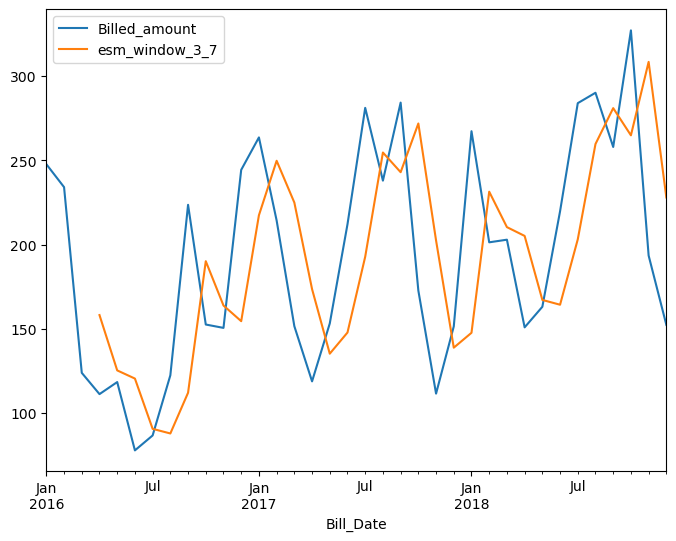

In [153]:
df_bill_2018[['Billed_amount', 'esm_window_3_7']].plot()

In [154]:
df_bill_2018['Billed_amount'].ewm(alpha=0.3, adjust=False, min_periods=3).mean()

Bill_Date
2016-01-01           NaN
2016-02-01           NaN
2016-03-01    207.705800
2016-04-01    178.760060
2016-05-01    160.643042
2016-06-01    135.793129
2016-07-01    121.056191
2016-08-01    121.459333
2016-09-01    152.107533
2016-10-01    152.237273
2016-11-01    151.728091
2016-12-01    179.520664
2017-01-01    204.756465
2017-02-01    207.625525
2017-03-01    190.799868
2017-04-01    169.196907
2017-05-01    164.391835
2017-06-01    178.698285
2017-07-01    209.445799
2017-08-01    218.003059
2017-09-01    237.892142
2017-10-01    218.331499
2017-11-01    186.285049
2017-12-01    175.825535
2018-01-01    203.273874
2018-02-01    202.696712
2018-03-01    202.760698
2018-04-01    187.190489
2018-05-01    179.954342
2018-06-01    191.896040
2018-07-01    219.521228
2018-08-01    240.709859
2018-09-01    245.884902
2018-10-01    270.276431
2018-11-01    247.240502
2018-12-01    218.770351
Name: Billed_amount, dtype: float64

In [155]:
df_bill_2018['esm_window_3_3'] = df_bill_2018['Billed_amount'].ewm(alpha=0.3, adjust=False, min_periods=3).mean().shift(1)

In [156]:
df_bill_2018

,Billed_amount,ma_rolling_3,wma_rolling_3,ewm_window_3,esm_window_3_7,esm_window_3_3
Bill_Date,,,,,,
2016-01-01,247.73,NaN,NaN,NaN,NaN,NaN
2016-02-01,234.11,NaN,NaN,247.730000,NaN,NaN
2016-03-01,123.85,NaN,NaN,240.920000,NaN,NaN
2016-04-01,111.22,201.896667,181.250000,182.385000,158.153800,207.705800
2016-05-01,118.37,156.393333,135.911667,146.802500,125.300140,178.760060
2016-06-01,77.81,117.813333,116.900000,132.586250,120.449042,160.643042
2016-07-01,86.67,102.466667,96.898333,105.198125,90.601713,135.793129
2016-08-01,122.40,94.283333,89.000000,95.934063,87.849514,121.056191
2016-09-01,223.62,95.626667,103.058333,109.167031,112.034854,121.459333


<Axes: xlabel='Bill_Date'>

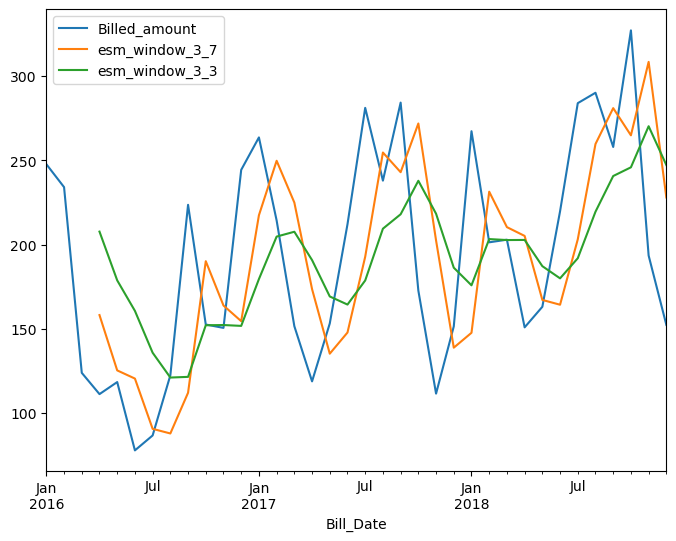

In [157]:
df_bill_2018[['Billed_amount', 'esm_window_3_7', 'esm_window_3_3']].plot()

In [158]:
((df_bill_2018['Billed_amount'] - df_bill_2018['wma_rolling_3']) ** 2).mean() ** 0.5

65.82572602256133

In [162]:
((df_bill_2018['Billed_amount'] - df_bill_2018['ewm_window_3']) ** 2).mean() ** 0.5

64.32131239414655

In [163]:
((df_bill_2018['Billed_amount'] - df_bill_2018['esm_window_3_7']) ** 2).mean() ** 0.5

61.26408398853503

In [164]:
((df_bill_2018['Billed_amount'] - df_bill_2018['esm_window_3_3']) ** 2).mean() ** 0.5

65.22424423118376

# Time Series Decomposition and Analysis

## Imports

In [165]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from datetime import datetime, timedelta

from statsmodels.tsa.stattools import kpss
import statsmodels.api as sm

import os

import warnings

## Parameters

In [166]:
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['axes.grid'] = False

## Data

In [167]:
def convert_to_date(x):
    return datetime.strptime(x, '%m/%d/%Y')

df = pd.read_csv('https://raw.githubusercontent.com/srivatsan88/YouTubeLI/master/dataset/amazon_revenue_profit.csv', 
                 parse_dates=['Quarter'], date_parser=convert_to_date)

In [168]:
df.head()

,Quarter,Revenue,Net Income
0,2020-03-31,75452,2535
1,2019-12-31,87437,3268
2,2019-09-30,69981,2134
3,2019-06-30,63404,2625
4,2019-03-31,59700,3561


## Exploration

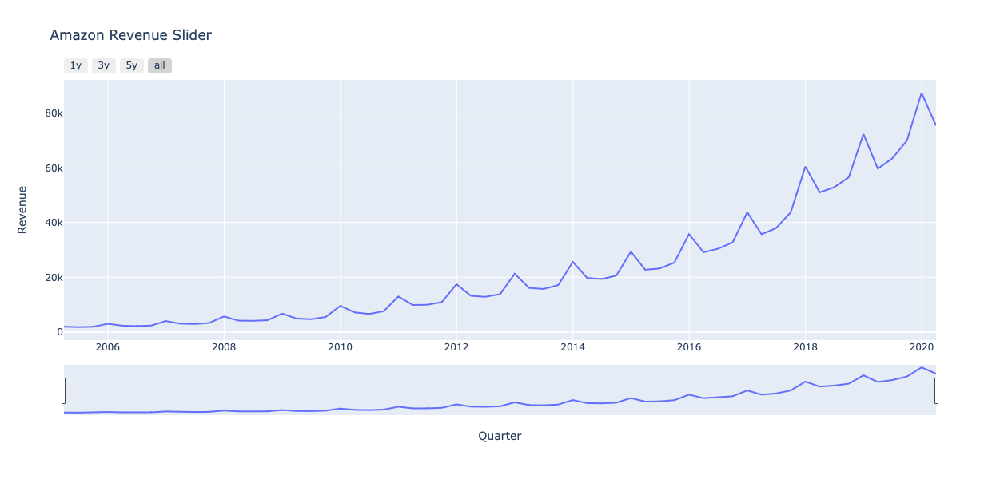

In [170]:
fig = px.line(df, x='Quarter', y='Revenue', title='Amazon Revenue Slider')
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list(
            [
                dict(count=1, label='1y', step='year', stepmode='backward'),
                dict(count=2, label='3y', step='year', stepmode='backward'),
                dict(count=3, label='5y', step='year', stepmode='backward'),
                dict(step='all')
            ]
        )
    )
)
fig.update_layout(height=600, width=1200)
fig.show()

Null hypothesis - data is stationary

Alternate hypothesis - data is not stationary

In [175]:
tstest = kpss(df['Revenue'], 'ct')

/var/folders/2x/hcfyt7ws2nnbdmgpn5t_gdx00000gn/T/ipykernel_2224/3465168009.py:1: InterpolationWarning:

The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.




In [176]:
tstest

(0.3066554597516965,
 0.01,
 4,
 {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216})

Additive - y_t = T_t + C_t + S_t + I_t

Multiplicative - y_t = T_t * C_t * S_t * I_t

In [179]:
df

,Quarter,Revenue,Net Income
0,2020-03-31,75452,2535
1,2019-12-31,87437,3268
2,2019-09-30,69981,2134
3,2019-06-30,63404,2625
4,2019-03-31,59700,3561
...,...,...,...
56,2006-03-31,2279,51
57,2005-12-31,2977,199
58,2005-09-30,1858,30
59,2005-06-30,1753,52


In [190]:
df = df.set_index('Quarter')

In [191]:
res = sm.tsa.seasonal_decompose(df['Revenue'], model='multiplicative')

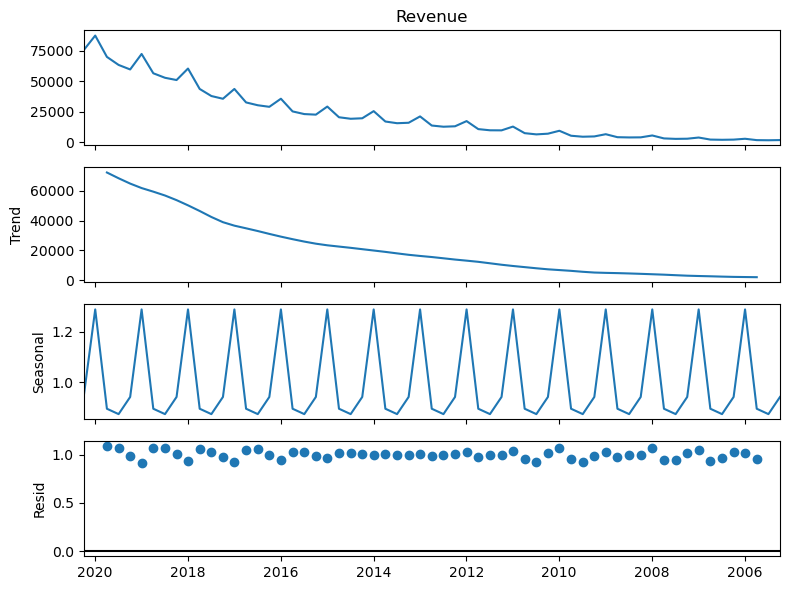

In [192]:
resplot = res.plot()

<Axes: xlabel='Quarter'>

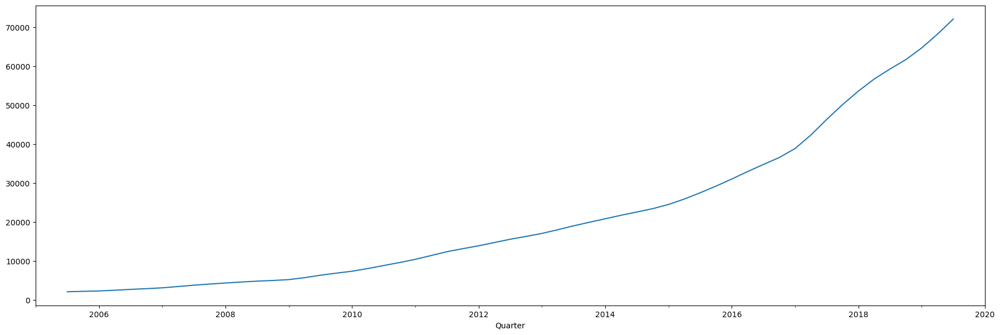

In [193]:
plt.figure(figsize=(22, 7))
res.trend.plot()

In [194]:
res.observed

Quarter
2020-03-31    75452.0
2019-12-31    87437.0
2019-09-30    69981.0
2019-06-30    63404.0
2019-03-31    59700.0
               ...   
2006-03-31     2279.0
2005-12-31     2977.0
2005-09-30     1858.0
2005-06-30     1753.0
2005-03-31     1902.0
Name: Revenue, Length: 61, dtype: float64

In [195]:
res.trend

Quarter
2020-03-31          NaN
2019-12-31          NaN
2019-09-30    72099.500
2019-06-30    68248.750
2019-03-31    64691.375
                ...    
2006-03-31     2369.375
2005-12-31     2265.000
2005-09-30     2169.625
2005-06-30          NaN
2005-03-31          NaN
Name: trend, Length: 61, dtype: float64

In [196]:
res.seasonal

Quarter
2020-03-31    0.941840
2019-12-31    1.289518
2019-09-30    0.894993
2019-06-30    0.873649
2019-03-31    0.941840
                ...   
2006-03-31    0.941840
2005-12-31    1.289518
2005-09-30    0.894993
2005-06-30    0.873649
2005-03-31    0.941840
Name: seasonal, Length: 61, dtype: float64

In [197]:
res.resid

Quarter
2020-03-31         NaN
2019-12-31         NaN
2019-09-30    1.084496
2019-06-30    1.063372
2019-03-31    0.979831
                ...   
2006-03-31    1.021253
2005-12-31    1.019256
2005-09-30    0.956844
2005-06-30         NaN
2005-03-31         NaN
Name: resid, Length: 61, dtype: float64

In [198]:
res.observed[2]

69981.0

In [199]:
res.trend[2] * res.seasonal[2] * res.resid[2]

69980.99999999999

<Axes: xlabel='Quarter'>

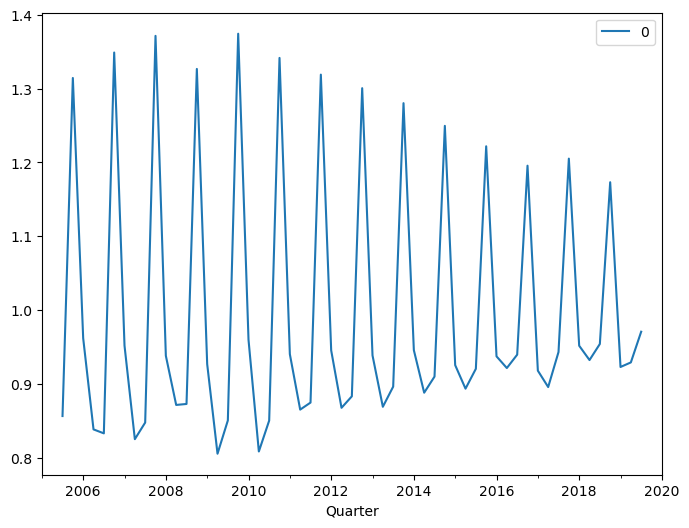

In [200]:
pd.DataFrame(res.observed / res.trend).plot()

# Time Series Useful Functions (Modeling and Analysis)

In [ ]:
# ... tbd

# Time Series Non Stationary Statistical Test (KPSS and ADF)

## Imports

In [201]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from datetime import datetime, timedelta

from statsmodels.tsa.stattools import kpss
from statsmodels.tsa.stattools import adfuller
import statsmodels.api as sm

import os

import warnings

## Parameters

In [202]:
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['axes.grid'] = False

## Data

In [203]:
def convert_to_date(x):
    return datetime.strptime(x, '%m/%d/%Y')

df = pd.read_csv('https://raw.githubusercontent.com/srivatsan88/YouTubeLI/master/dataset/amazon_revenue_profit.csv', 
                 parse_dates=['Quarter'], date_parser=convert_to_date)

In [218]:
df.head()

,Quarter,Revenue,Net Income
0,2020-03-31,75452,2535
1,2019-12-31,87437,3268
2,2019-09-30,69981,2134
3,2019-06-30,63404,2625
4,2019-03-31,59700,3561


## Exploration

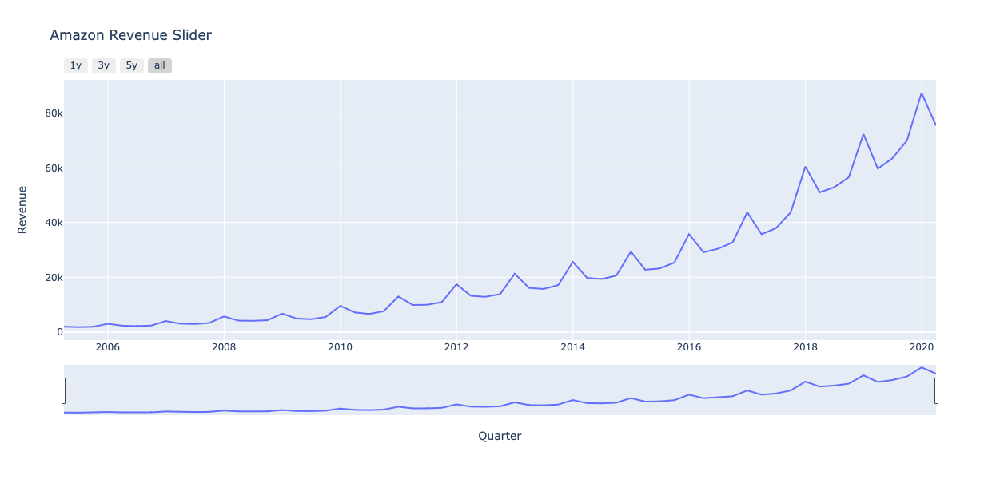

In [204]:
fig = px.line(df, x='Quarter', y='Revenue', title='Amazon Revenue Slider')
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list(
            [
                dict(count=1, label='1y', step='year', stepmode='backward'),
                dict(count=2, label='3y', step='year', stepmode='backward'),
                dict(count=3, label='5y', step='year', stepmode='backward'),
                dict(step='all')
            ]
        )
    )
)
fig.update_layout(height=600, width=1200)
fig.show()

Null hypothesis - data is stationary

Alternate hypothesis - data is not stationary

In [205]:
stats, p, lags, critical_values = kpss(df['Revenue'], 'ct') # c - data is stationary around the constant, ct - data is stationary around the trend

In [208]:
print(f'Test statistics: {stats}')
print(f'p-value: {p}')
print(f'Critical Values: {critical_values}')

if p < 0.05:
    print('Series is not stationary')
else:
    print('Series is stationary')

Test statistics: 0.3066554597516965
p-value: 0.01
Critical Values: {'10%': 0.119, '5%': 0.146, '2.5%': 0.176, '1%': 0.216}
Series is not stationary


Null hypothesis - series possesses a unit root and hence is not stationary

Alternate hypothesis - series is stationary

In [216]:
results = adfuller(df['Revenue']) # c - data is stationary around the constant, ct - data is stationary around the trend

In [217]:
print(f'Test statistics: {results[0]}')
print(f'p-value: {results[1]}')
print(f'Critical Values: {results[4]}')

if results[1] > 0.05:
    print('Series is not stationary')
else:
    print('Series is stationary')

Test statistics: -2.4448360381972396
p-value: 0.129479431218386
Critical Values: {'1%': -3.568485864, '5%': -2.92135992, '10%': -2.5986616}
Series is not stationary


Based on that we can use ARMA model and we need to use ARIMA model (for not stationary datas)

# Auto ARIMA

## Imports

In [219]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

from datetime import datetime, timedelta

import pmdarima as pm

import os

import warnings

## Parameters

In [220]:
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['axes.grid'] = False

## Data

In [221]:
df = pd.read_csv('https://raw.githubusercontent.com/srivatsan88/YouTubeLI/master/dataset/nyc_energy_consumption.csv')

In [222]:
df.head()

,timeStamp,demand,precip,temp
0,2012-01-01 00:00:00,4937.5,0.0,46.13
1,2012-01-01 01:00:00,4752.1,0.0,45.89
2,2012-01-01 02:00:00,4542.6,0.0,45.04
3,2012-01-01 03:00:00,4357.7,0.0,45.03
4,2012-01-01 04:00:00,4275.5,0.0,42.61


## Exploration

In [223]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 49205 entries, 0 to 49204
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   timeStamp  49205 non-null  object 
 1   demand     49124 non-null  float64
 2   precip     48975 non-null  float64
 3   temp       49019 non-null  float64
dtypes: float64(3), object(1)
memory usage: 1.5+ MB


In [224]:
df.describe()

,demand,precip,temp
count,49124.000000,48975.000000,49019.000000
mean,6067.447361,0.003522,55.520428
std,1285.607657,0.022841,17.704848
min,2859.600000,0.000000,0.330000
25%,5133.862250,0.000000,41.415000
50%,6020.071000,0.000000,56.260000
75%,6684.300000,0.000000,70.540000
max,11456.000000,0.905100,97.260000


In [225]:
df['timeStamp'] = pd.to_datetime(df['timeStamp'])

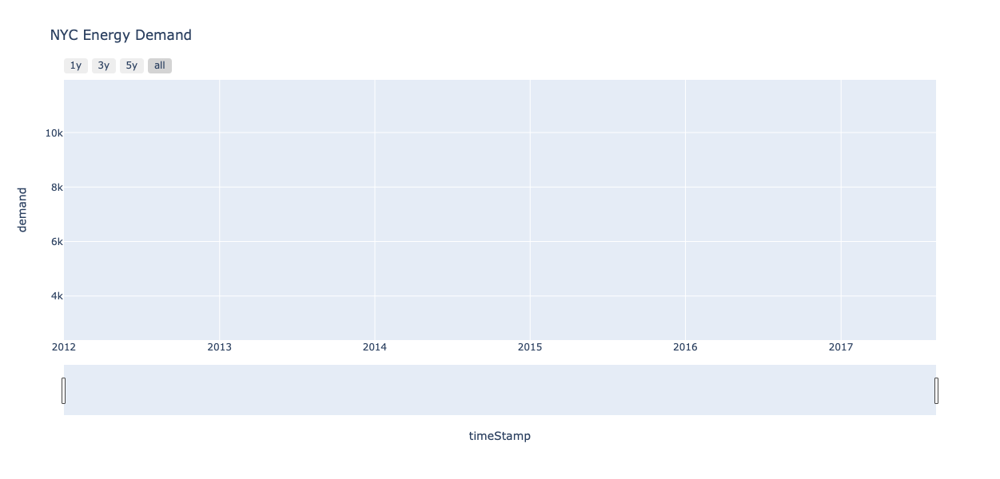

In [226]:
fig = px.line(df, x='timeStamp', y='demand', title='NYC Energy Demand')
fig.update_xaxes(
    rangeslider_visible=True,
    rangeselector=dict(
        buttons=list(
            [
                dict(count=1, label='1y', step='year', stepmode='backward'),
                dict(count=2, label='3y', step='year', stepmode='backward'),
                dict(count=3, label='5y', step='year', stepmode='backward'),
                dict(step='all')
            ]
        )
    )
)
fig.update_layout(height=600, width=1200)
fig.show()

In [227]:
df_ny = df.set_index('timeStamp')

array([<Axes: xlabel='timeStamp'>, <Axes: xlabel='timeStamp'>,
       <Axes: xlabel='timeStamp'>], dtype=object)

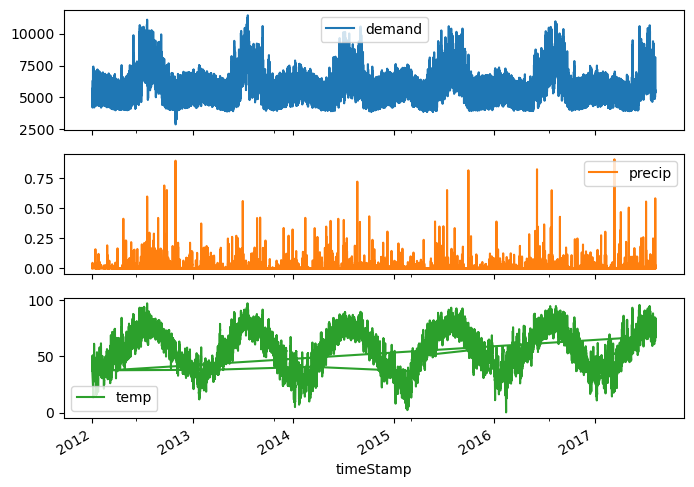

In [228]:
df_ny.plot(subplots=True)

In [229]:
df.query('demand != demand') # df[df['demand'].isnull()]

,timeStamp,demand,precip,temp
49124,2012-03-11 02:00:00,NaN,0.0000,37.78
49125,2013-03-10 02:00:00,NaN,0.0000,38.18
49126,2014-03-09 02:00:00,NaN,0.0000,40.86
49127,2015-03-08 02:00:00,NaN,0.0000,36.96
49128,2015-03-11 11:00:00,NaN,0.0000,49.95
...,...,...,...,...
49200,2017-08-12 02:00:00,NaN,0.0000,70.84
49201,2017-08-12 03:00:00,NaN,0.0000,70.57
49202,2017-08-12 04:00:00,NaN,0.0000,69.89
49203,2017-08-12 05:00:00,NaN,0.0000,68.59


In [230]:
df['demand'] = df['demand'].fillna(method='ffill')
df['temp'] = df['temp'].fillna(method='ffill')

In [231]:
df.isnull().any()

timeStamp    False
demand       False
precip        True
temp         False
dtype: bool

In [232]:
df_ny = df.set_index('timeStamp')

array([<Axes: xlabel='timeStamp'>, <Axes: xlabel='timeStamp'>,
       <Axes: xlabel='timeStamp'>], dtype=object)

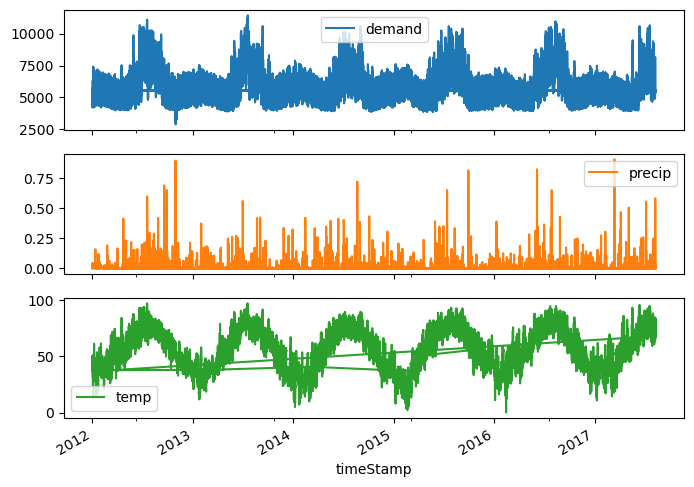

In [234]:
df_ny.plot(subplots=True)

In [235]:
df_ny.resample('M').mean()

,demand,precip,temp
timeStamp,,,
2012-01-31,5757.495833,0.003116,37.174288
2012-02-29,5622.331609,0.001650,40.448046
2012-03-31,5479.919198,0.001179,49.607917
2012-04-30,5368.945833,0.003959,54.255903
2012-05-31,5867.896102,0.005064,64.188078
...,...,...,...
2017-04-30,5233.477382,0.002942,55.621764
2017-05-31,5421.773060,0.004031,61.115457
2017-06-30,6597.990346,0.003008,71.962625


array([<Axes: xlabel='timeStamp'>, <Axes: xlabel='timeStamp'>,
       <Axes: xlabel='timeStamp'>], dtype=object)

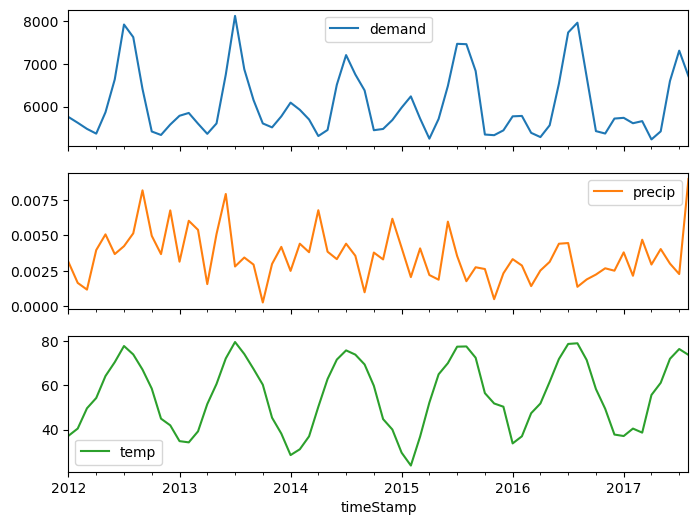

In [236]:
df_ny.resample('M').mean().plot(subplots=True)

In [243]:
df_ny_monthly = df_ny.resample('M').mean()

In [244]:
model = pm.auto_arima(df_ny_monthly['demand'], m=12, seasonal=True, start_p=0, start_q=0, max_order=4, 
                      test='adf', error_action='ignore', suppress_warnings=True, stepwise=True, trace=True)

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.20 sec
 ARIMA(0,0,0)(0,0,0)[12] intercept   : AIC=1100.321, Time=0.00 sec
 ARIMA(1,0,0)(1,0,0)[12] intercept   : AIC=1023.743, Time=0.14 sec
 ARIMA(0,0,1)(0,0,1)[12] intercept   : AIC=inf, Time=0.07 sec
 ARIMA(0,0,0)(0,0,0)[12]             : AIC=1380.758, Time=0.00 sec
 ARIMA(1,0,0)(0,0,0)[12] intercept   : AIC=1065.516, Time=0.01 sec
 ARIMA(1,0,0)(2,0,0)[12] intercept   : AIC=1022.328, Time=0.45 sec
 ARIMA(1,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.60 sec
 ARIMA(1,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.09 sec
 ARIMA(0,0,0)(2,0,0)[12] intercept   : AIC=1097.636, Time=0.20 sec
 ARIMA(2,0,0)(2,0,0)[12] intercept   : AIC=1013.997, Time=0.83 sec
 ARIMA(2,0,0)(1,0,0)[12] intercept   : AIC=1014.059, Time=0.15 sec
 ARIMA(2,0,0)(2,0,1)[12] intercept   : AIC=inf, Time=0.62 sec
 ARIMA(2,0,0)(1,0,1)[12] intercept   : AIC=inf, Time=0.18 sec
 ARIMA(3,0,0)(2,0,0)[12] intercept   : AIC=1011.6

In [245]:
model.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                                       y   No. Observations:                   68
Model:             SARIMAX(2, 0, 0)x(0, 0, [1, 2], 12)   Log Likelihood                -490.572
Date:                                 Sun, 28 Apr 2024   AIC                            993.144
Time:                                         23:04:43   BIC                           1006.461
Sample:                                     01-31-2012   HQIC                           998.420
                                          - 08-31-2017                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   3721.6223    792.260      4.697      0.000    2168.821    5274.424
ar.L1          0.8586      0.123      6.985      0.000       0.618       1.099
ar.L2         -0.4748      0.142     -3.352      0.001      -0.752      -0.197
ma.S.L12       0.8923      0.137      6.501      0.000       0.623       1.161
ma.S.L24       0.4571      0.206      2.222      0.026       0.054       0.860
sigma2      9.046e+04   1.58e+04      5.726      0.000    5.95e+04    1.21e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):                 5.55
Prob(Q):                              0.89   Prob(JB):                         0.06
Heteroskedasticity (H):               0.78   Skew:                             0.52
Prob(H) (two-sided):                  0.55   Kurtosis:                         3.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [246]:
df_ny_monthly

,demand,precip,temp
timeStamp,,,
2012-01-31,5757.495833,0.003116,37.174288
2012-02-29,5622.331609,0.001650,40.448046
2012-03-31,5479.919198,0.001179,49.607917
2012-04-30,5368.945833,0.003959,54.255903
2012-05-31,5867.896102,0.005064,64.188078
...,...,...,...
2017-04-30,5233.477382,0.002942,55.621764
2017-05-31,5421.773060,0.004031,61.115457
2017-06-30,6597.990346,0.003008,71.962625


In [247]:
df_train = df_ny_monthly[(df_ny_monthly.index.get_level_values(0) >= '2012-01-31') & (df_ny_monthly.index.get_level_values(0) <= '2017-04-30')]
df_test = df_ny_monthly[(df_ny_monthly.index.get_level_values(0) > '2017-04-30')]

In [248]:
df_test

,demand,precip,temp
timeStamp,,,
2017-05-31,5421.773060,0.004031,61.115457
2017-06-30,6597.990346,0.003008,71.962625
2017-07-31,7306.861511,0.002272,76.380363
2017-08-31,6711.707542,0.008961,73.730258


In [249]:
df_test.shape

(4, 3)

In [252]:
model.fit(df_train['demand'])

ARIMA(order=(2, 0, 0), scoring_args={}, seasonal_order=(0, 0, 2, 12),
      suppress_warnings=True)

In [254]:
forecast = model.predict(n_periods=4, return_conf_int=True)

In [255]:
forecast

(2017-05-31    5320.832824
 2017-06-30    6194.150621
 2017-07-31    7184.108089
 2017-08-31    7297.999602
 Freq: ME, dtype: float64,
 array([[4724.37022531, 5917.29542264],
        [5391.43561565, 6996.86562674],
        [6358.61988782, 8009.59628988],
        [6467.74931452, 8128.24988852]]))

In [271]:
df_forecast = pd.DataFrame(forecast[0], index=df_test.index, columns=['Prediction'])

In [272]:
df_forecast

,Prediction
timeStamp,
2017-05-31,5320.832824
2017-06-30,6194.150621
2017-07-31,7184.108089
2017-08-31,7297.999602


<Axes: xlabel='timeStamp'>

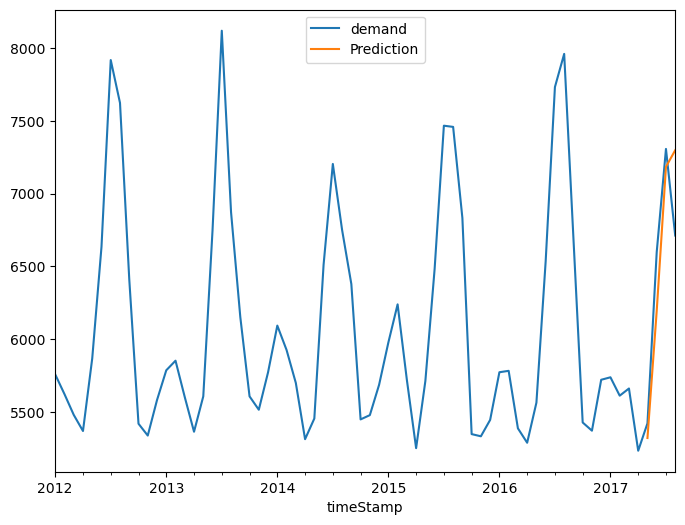

In [273]:
pd.concat([df_ny_monthly['demand'], df_forecast], axis=1).plot()

In [274]:
forecast1 = model.predict(n_periods=8, return_conf_int=True)

In [275]:
forecast1

(2017-05-31    5320.832824
 2017-06-30    6194.150621
 2017-07-31    7184.108089
 2017-08-31    7297.999602
 2017-09-30    6401.927310
 2017-10-31    5789.924239
 2017-11-30    5693.039684
 2017-12-31    5951.573131
 Freq: ME, dtype: float64,
 array([[4724.37022531, 5917.29542264],
        [5391.43561565, 6996.86562674],
        [6358.61988782, 8009.59628988],
        [6467.74931452, 8128.24988852],
        [5553.64733033, 7250.20729041],
        [4934.10754214, 6645.74093633],
        [4837.08543089, 6548.99393811],
        [5094.94724282, 6808.19901818]]))

In [276]:
forecast_range = pd.date_range(start='2017-05-31', periods=8, freq='M')

In [277]:
df_forecast1 = pd.DataFrame(forecast1[0], index=forecast_range, columns=['Prediction'])

<Axes: >

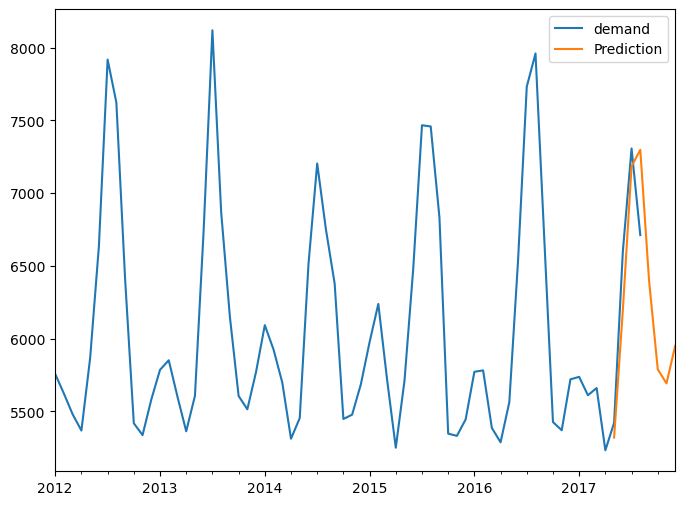

In [278]:
pd.concat([df_ny_monthly['demand'], df_forecast1], axis=1).plot()

In [279]:
lower = pd.Series(forecast1[1][:, 0], index=forecast_range)
upper = pd.Series(forecast1[1][:, 1], index=forecast_range)

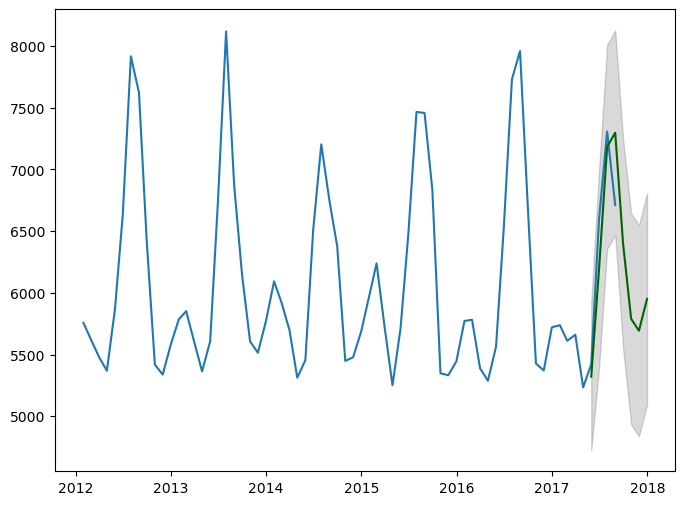

In [281]:
plt.plot(df_ny_monthly['demand'])
plt.plot(df_forecast1, color='darkgreen')
plt.fill_between(forecast_range, lower, upper, color='k', alpha=0.15)

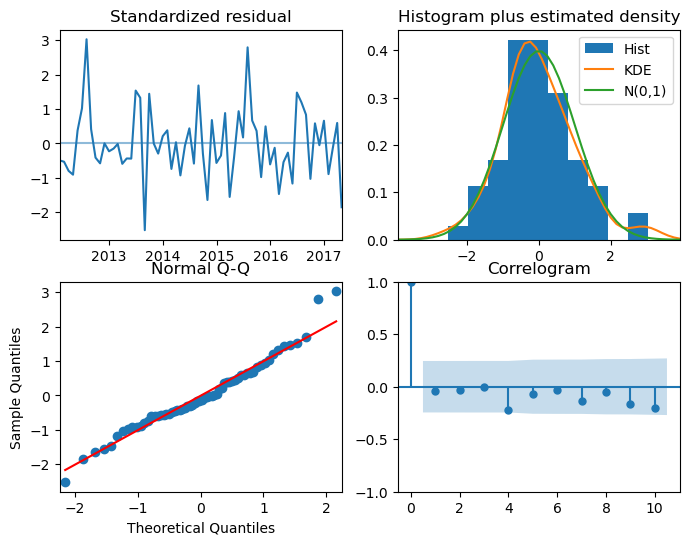

In [282]:
out = model.plot_diagnostics()

# Facebook Prophet

In [ ]:
# ... tbd

# Data Preparation for LSTM and RNN models

## Imports

In [1]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

import warnings

## Parameters

In [2]:
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['axes.grid'] = False

## Data

In [3]:
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/00374/energydata_complete.csv')

In [5]:
df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


## Exploration

In [6]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

In [7]:
df.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [8]:
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d %H:%M:%S') # infer_dataframe_format=True

<Axes: xlabel='date'>

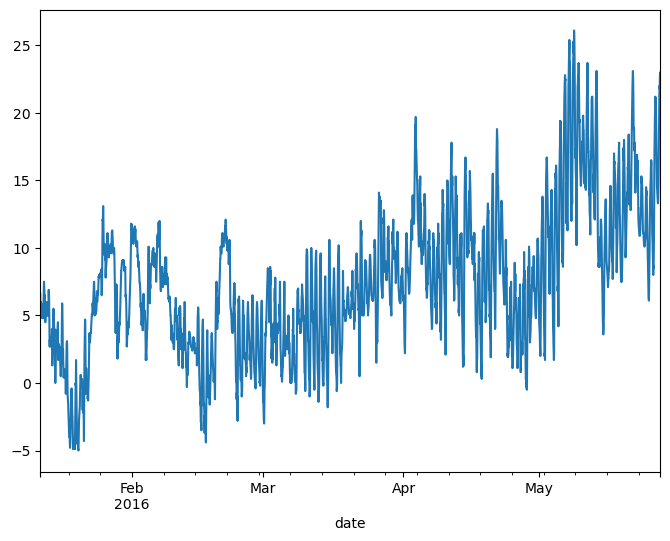

In [10]:
df.set_index('date')['T_out'].plot()

array([<Axes: xlabel='date'>, <Axes: xlabel='date'>,
       <Axes: xlabel='date'>, <Axes: xlabel='date'>], dtype=object)

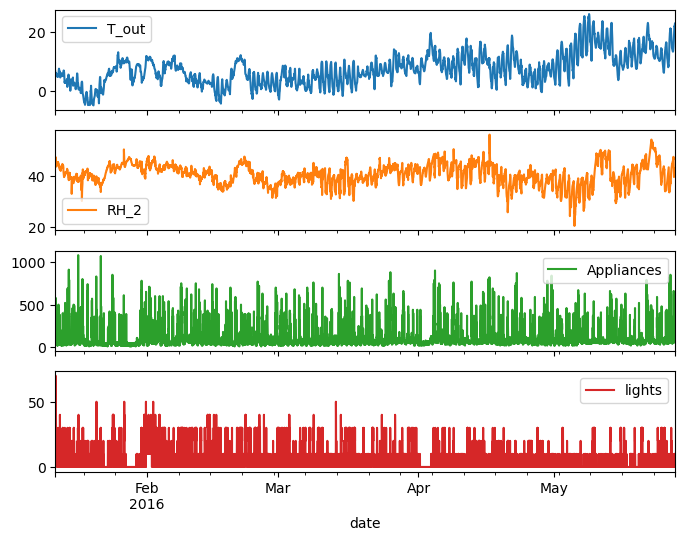

In [11]:
df.set_index('date')[['T_out', 'RH_2', 'Appliances', 'lights']].plot(subplots=True)

In [12]:
df.count()

date           19735
Appliances     19735
lights         19735
T1             19735
RH_1           19735
T2             19735
RH_2           19735
T3             19735
RH_3           19735
T4             19735
RH_4           19735
T5             19735
RH_5           19735
T6             19735
RH_6           19735
T7             19735
RH_7           19735
T8             19735
RH_8           19735
T9             19735
RH_9           19735
T_out          19735
Press_mm_hg    19735
RH_out         19735
Windspeed      19735
Visibility     19735
Tdewpoint      19735
rv1            19735
rv2            19735
dtype: int64

In [15]:
features = df[['Appliances', 'T_out', 'RH_2']].to_numpy().tolist()
target = df['Appliances'].tolist()

In [16]:
features[0:11]

[[60.0, 6.6, 44.79],
 [60.0, 6.48333333333333, 44.7225],
 [50.0, 6.36666666666667, 44.6266666666667],
 [50.0, 6.25, 44.59],
 [60.0, 6.13333333333333, 44.53],
 [50.0, 6.01666666666667, 44.5],
 [60.0, 5.9, 44.5],
 [60.0, 5.91666666666667, 44.5],
 [60.0, 5.93333333333333, 44.4333333333333],
 [70.0, 5.95, 44.4],
 [230.0, 5.96666666666667, 44.4]]

In [17]:
target[0:11]

[60, 60, 50, 50, 60, 50, 60, 60, 60, 70, 230]

In [18]:
ts_generator = TimeseriesGenerator(features, target, length=6, sampling_rate=1, batch_size=1)

In [19]:
ts_generator[0]

(array([[[60.        ,  6.6       , 44.79      ],
         [60.        ,  6.48333333, 44.7225    ],
         [50.        ,  6.36666667, 44.62666667],
         [50.        ,  6.25      , 44.59      ],
         [60.        ,  6.13333333, 44.53      ],
         [50.        ,  6.01666667, 44.5       ]]]),
 array([60]))

In [20]:
ts_generator[0][0][0].shape

(6, 3)

In [21]:
ts_generator[1]

(array([[[60.        ,  6.48333333, 44.7225    ],
         [50.        ,  6.36666667, 44.62666667],
         [50.        ,  6.25      , 44.59      ],
         [60.        ,  6.13333333, 44.53      ],
         [50.        ,  6.01666667, 44.5       ],
         [60.        ,  5.9       , 44.5       ]]]),
 array([60]))

In [22]:
ts_generator[2]

(array([[[50.        ,  6.36666667, 44.62666667],
         [50.        ,  6.25      , 44.59      ],
         [60.        ,  6.13333333, 44.53      ],
         [50.        ,  6.01666667, 44.5       ],
         [60.        ,  5.9       , 44.5       ],
         [60.        ,  5.91666667, 44.5       ]]]),
 array([60]))

In [23]:
len(ts_generator)

19729

Input - 1, 2, 3, 4, 5, 6, 7, 8, 9

Sliding window (window size 3, stride 1) - 1, 2, 3    2, 3, 4    4, 5, 6

Sliding window (window size 3, stride 2) - 1, 2, 3    3, 4, 5    7, 8, 9

Tumbling window (window size 3) - 1, 2, 3    4, 5, 6    7, 8, 9

In [32]:
ts_generator = TimeseriesGenerator(features, target, length=6, sampling_rate=1, batch_size=1, stride=2)

In [33]:
len(ts_generator)

9865

In [34]:
ts_generator[0]

(array([[[60.        ,  6.6       , 44.79      ],
         [60.        ,  6.48333333, 44.7225    ],
         [50.        ,  6.36666667, 44.62666667],
         [50.        ,  6.25      , 44.59      ],
         [60.        ,  6.13333333, 44.53      ],
         [50.        ,  6.01666667, 44.5       ]]]),
 array([60]))

In [35]:
ts_generator[1]

(array([[[50.        ,  6.36666667, 44.62666667],
         [50.        ,  6.25      , 44.59      ],
         [60.        ,  6.13333333, 44.53      ],
         [50.        ,  6.01666667, 44.5       ],
         [60.        ,  5.9       , 44.5       ],
         [60.        ,  5.91666667, 44.5       ]]]),
 array([60]))

In [26]:
pd.concat([df['Appliances'], df['Appliances'].shift(-1), df['Appliances'].shift(-2)], axis=1)

,Appliances,Appliances,Appliances
0,60,60.0,50.0
1,60,50.0,50.0
2,50,50.0,60.0
3,50,60.0,50.0
4,60,50.0,60.0
...,...,...,...
19730,100,90.0,270.0
19731,90,270.0,420.0
19732,270,420.0,430.0
19733,420,430.0,NaN


In [27]:
multi_target = pd.concat([df['Appliances'].shift(-1), df['Appliances'].shift(-2)], axis=1).dropna().to_numpy().tolist()

In [28]:
multi_target[0:13]

[[60.0, 50.0],
 [50.0, 50.0],
 [50.0, 60.0],
 [60.0, 50.0],
 [50.0, 60.0],
 [60.0, 60.0],
 [60.0, 60.0],
 [60.0, 70.0],
 [70.0, 230.0],
 [230.0, 580.0],
 [580.0, 430.0],
 [430.0, 250.0],
 [250.0, 100.0]]

In [29]:
ts_generator = TimeseriesGenerator(features[:-2], multi_target, length=6, sampling_rate=1, batch_size=1, stride=6)

In [30]:
ts_generator[0]

(array([[[60.        ,  6.6       , 44.79      ],
         [60.        ,  6.48333333, 44.7225    ],
         [50.        ,  6.36666667, 44.62666667],
         [50.        ,  6.25      , 44.59      ],
         [60.        ,  6.13333333, 44.53      ],
         [50.        ,  6.01666667, 44.5       ]]]),
 array([[60., 60.]]))

In [31]:
ts_generator[1]

(array([[[ 60.        ,   5.9       ,  44.5       ],
         [ 60.        ,   5.91666667,  44.5       ],
         [ 60.        ,   5.93333333,  44.43333333],
         [ 70.        ,   5.95      ,  44.4       ],
         [230.        ,   5.96666667,  44.4       ],
         [580.        ,   5.98333333,  44.4       ]]]),
 array([[250., 100.]]))

# LSTM

## Imports

In [36]:
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import MinMaxScaler, StandardScaler

import tensorflow as tf
from tensorflow.keras.preprocessing.sequence import TimeseriesGenerator

## Parameters

In [37]:
warnings.filterwarnings('ignore')

plt.rcParams['figure.figsize'] = (8, 6)
plt.rcParams['axes.grid'] = False

## Data

In [38]:
df = pd.read_csv('https://archive.ics.uci.edu/ml/machine-learning-databases/00374/energydata_complete.csv')

In [39]:
df.head()

,date,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
0,2016-01-11 17:00:00,60,30,19.89,47.596667,19.2,44.790000,19.79,44.730000,19.000000,...,17.033333,45.53,6.600000,733.5,92.0,7.000000,63.000000,5.3,13.275433,13.275433
1,2016-01-11 17:10:00,60,30,19.89,46.693333,19.2,44.722500,19.79,44.790000,19.000000,...,17.066667,45.56,6.483333,733.6,92.0,6.666667,59.166667,5.2,18.606195,18.606195
2,2016-01-11 17:20:00,50,30,19.89,46.300000,19.2,44.626667,19.79,44.933333,18.926667,...,17.000000,45.50,6.366667,733.7,92.0,6.333333,55.333333,5.1,28.642668,28.642668
3,2016-01-11 17:30:00,50,40,19.89,46.066667,19.2,44.590000,19.79,45.000000,18.890000,...,17.000000,45.40,6.250000,733.8,92.0,6.000000,51.500000,5.0,45.410389,45.410389
4,2016-01-11 17:40:00,60,40,19.89,46.333333,19.2,44.530000,19.79,45.000000,18.890000,...,17.000000,45.40,6.133333,733.9,92.0,5.666667,47.666667,4.9,10.084097,10.084097


## Exploration

In [40]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19735 entries, 0 to 19734
Data columns (total 29 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   date         19735 non-null  object 
 1   Appliances   19735 non-null  int64  
 2   lights       19735 non-null  int64  
 3   T1           19735 non-null  float64
 4   RH_1         19735 non-null  float64
 5   T2           19735 non-null  float64
 6   RH_2         19735 non-null  float64
 7   T3           19735 non-null  float64
 8   RH_3         19735 non-null  float64
 9   T4           19735 non-null  float64
 10  RH_4         19735 non-null  float64
 11  T5           19735 non-null  float64
 12  RH_5         19735 non-null  float64
 13  T6           19735 non-null  float64
 14  RH_6         19735 non-null  float64
 15  T7           19735 non-null  float64
 16  RH_7         19735 non-null  float64
 17  T8           19735 non-null  float64
 18  RH_8         19735 non-null  float64
 19  T9  

In [41]:
df.describe()

,Appliances,lights,T1,RH_1,T2,RH_2,T3,RH_3,T4,RH_4,...,T9,RH_9,T_out,Press_mm_hg,RH_out,Windspeed,Visibility,Tdewpoint,rv1,rv2
count,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,...,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000,19735.000000
mean,97.694958,3.801875,21.686571,40.259739,20.341219,40.420420,22.267611,39.242500,20.855335,39.026904,...,19.485828,41.552401,7.411665,755.522602,79.750418,4.039752,38.330834,3.760707,24.988033,24.988033
std,102.524891,7.935988,1.606066,3.979299,2.192974,4.069813,2.006111,3.254576,2.042884,4.341321,...,2.014712,4.151497,5.317409,7.399441,14.901088,2.451221,11.794719,4.194648,14.496634,14.496634
min,10.000000,0.000000,16.790000,27.023333,16.100000,20.463333,17.200000,28.766667,15.100000,27.660000,...,14.890000,29.166667,-5.000000,729.300000,24.000000,0.000000,1.000000,-6.600000,0.005322,0.005322
25%,50.000000,0.000000,20.760000,37.333333,18.790000,37.900000,20.790000,36.900000,19.530000,35.530000,...,18.000000,38.500000,3.666667,750.933333,70.333333,2.000000,29.000000,0.900000,12.497889,12.497889
50%,60.000000,0.000000,21.600000,39.656667,20.000000,40.500000,22.100000,38.530000,20.666667,38.400000,...,19.390000,40.900000,6.916667,756.100000,83.666667,3.666667,40.000000,3.433333,24.897653,24.897653
75%,100.000000,0.000000,22.600000,43.066667,21.500000,43.260000,23.290000,41.760000,22.100000,42.156667,...,20.600000,44.338095,10.408333,760.933333,91.666667,5.500000,40.000000,6.566667,37.583769,37.583769
max,1080.000000,70.000000,26.260000,63.360000,29.856667,56.026667,29.236000,50.163333,26.200000,51.090000,...,24.500000,53.326667,26.100000,772.300000,100.000000,14.000000,66.000000,15.500000,49.996530,49.996530


In [42]:
df['date'] = pd.to_datetime(df['date'], format='%Y-%m-%d %H:%M:%S') # infer_dataframe_format=True

In [44]:
scaler = MinMaxScaler()
df_scaled = scaler.fit_transform(df[['Appliances', 'T_out', 'RH_1', 'Visibility']])

In [45]:
df_scaled

array([[0.04672897, 0.37299035, 0.56618659, 0.95384615],
       [0.04672897, 0.36923901, 0.54132648, 0.89487179],
       [0.03738318, 0.36548767, 0.53050179, 0.83589744],
       ...,
       [0.24299065, 0.88317256, 0.53866618, 0.37435897],
       [0.38317757, 0.87888532, 0.54949087, 0.38717949],
       [0.39252336, 0.87459807, 0.53875791, 0.4       ]])

In [46]:
features = df_scaled
target = df_scaled[:, 0]

In [47]:
TimeseriesGenerator(features, target, length=2, sampling_rate=1, batch_size=1)[0]

(array([[[0.04672897, 0.37299035, 0.56618659, 0.95384615],
         [0.04672897, 0.36923901, 0.54132648, 0.89487179]]]),
 array([0.03738318]))

In [48]:
x_train, x_test, y_train, y_test = train_test_split(features, target, test_size=0.2, random_state=42, shuffle=False)

In [49]:
x_train.shape

(15788, 4)

In [50]:
x_test.shape

(3947, 4)

In [51]:
win_length = 72
num_features = 4
batch_size = 32

In [53]:
train_generator = TimeseriesGenerator(x_train, y_train, length=win_length, sampling_rate=1, batch_size=batch_size)
test_generator = TimeseriesGenerator(x_test, y_test, length=win_length, sampling_rate=1, batch_size=batch_size)

In [54]:
train_generator[0]

(array([[[0.04672897, 0.37299035, 0.56618659, 0.95384615],
         [0.04672897, 0.36923901, 0.54132648, 0.89487179],
         [0.03738318, 0.36548767, 0.53050179, 0.83589744],
         ...,
         [0.02803738, 0.31993569, 0.53417118, 0.6       ],
         [0.02803738, 0.3204716 , 0.5376571 , 0.6       ],
         [0.04672897, 0.3210075 , 0.53224475, 0.6       ]],
 
        [[0.04672897, 0.36923901, 0.54132648, 0.89487179],
         [0.03738318, 0.36548767, 0.53050179, 0.83589744],
         [0.03738318, 0.36173633, 0.52408036, 0.77692308],
         ...,
         [0.02803738, 0.3204716 , 0.5376571 , 0.6       ],
         [0.04672897, 0.3210075 , 0.53224475, 0.6       ],
         [0.03738318, 0.32154341, 0.53224475, 0.6       ]],
 
        [[0.03738318, 0.36548767, 0.53050179, 0.83589744],
         [0.03738318, 0.36173633, 0.52408036, 0.77692308],
         [0.04672897, 0.35798499, 0.53141914, 0.71794872],
         ...,
         [0.04672897, 0.3210075 , 0.53224475, 0.6       ],
        

In [55]:
# MODELING
model = tf.keras.Sequential()
model.add(tf.keras.layers.LSTM(128, input_shape=(win_length, num_features), return_sequences=True))
model.add(tf.keras.layers.LeakyReLU(alpha=0.5))
model.add(tf.keras.layers.LSTM(128, return_sequences=True))
model.add(tf.keras.layers.LeakyReLU(alpha=0.5))
model.add(tf.keras.layers.Dropout(0.3))
model.add(tf.keras.layers.LSTM(64, return_sequences=False))
model.add(tf.keras.layers.Dropout(0.3))
model.add(tf.keras.layers.Dense(1))

2024-04-29 12:35:03.388454: I metal_plugin/src/device/metal_device.cc:1154] Metal device set to: Apple M1
2024-04-29 12:35:03.388608: I metal_plugin/src/device/metal_device.cc:296] systemMemory: 8.00 GB
2024-04-29 12:35:03.388619: I metal_plugin/src/device/metal_device.cc:313] maxCacheSize: 2.67 GB
2024-04-29 12:35:03.389251: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2024-04-29 12:35:03.390288: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)


In [56]:
model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ lstm (LSTM)                     │ (None, 72, 128)        │        68,096 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu (LeakyReLU)         │ (None, 72, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 72, 128)        │       131,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_1 (LeakyReLU)       │ (None, 72, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 72, 128)        │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_2 (LSTM)                   │ (None, 64)             │        49,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1)              │            65 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 249,153 (973.25 KB)

 Trainable params: 249,153 (973.25 KB)

 Non-trainable params: 0 (0.00 B)

In [57]:
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=2, mode='min')

In [58]:
model.compile(
    loss=tf.losses.MeanSquaredError(),
    optimizer=tf.optimizers.Adam(),
    metrics=[tf.metrics.MeanAbsoluteError()]
)

In [60]:
history = model.fit(train_generator, epochs=50, validation_data=test_generator, shuffle=False, callbacks=[early_stopping])

Epoch 1/50


2024-04-29 12:38:38.328056: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:117] Plugin optimizer for device_type GPU is enabled.


492/492 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - loss: 0.0109 - mean_absolute_error: 0.0619 - val_loss: 0.0051 - val_mean_absolute_error: 0.0443
Epoch 2/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0081 - mean_absolute_error: 0.0496 - val_loss: 0.0035 - val_mean_absolute_error: 0.0320
Epoch 3/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0053 - mean_absolute_error: 0.0383 - val_loss: 0.0030 - val_mean_absolute_error: 0.0275
Epoch 4/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 17s 35ms/step - loss: 0.0048 - mean_absolute_error: 0.0353 - val_loss: 0.0030 - val_mean_absolute_error: 0.0280
Epoch 5/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0046 - mean_absolute_error: 0.0346 - val_loss: 0.0029 - val_mean_absolute_error: 0.0266
Epoch 6/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0046 - mean_absolute_error: 0.0342 - val_loss: 0.0030 - val_mean_absolute_error: 0.0284
Epoch 7/50
492/492 ━━━━━━━━━━━━━━━━━━━━ 17s 34ms/step - loss: 0.0045 - mean_absolute_error: 0.0339 

In [62]:
model.evaluate(test_generator, verbose=0)

[0.0029302253387868404, 0.027504105120897293]

In [64]:
prediction = model.predict(test_generator)

122/122 ━━━━━━━━━━━━━━━━━━━━ 1s 7ms/step


In [65]:
prediction.shape

(3875, 1)

In [66]:
prediction

array([[0.05872801],
       [0.05479307],
       [0.07311971],
       ...,
       [0.08702646],
       [0.253654  ],
       [0.27199954]], dtype=float32)

In [67]:
y_test

array([0.3364486 , 0.54205607, 0.28971963, ..., 0.24299065, 0.38317757,
       0.39252336])

In [68]:
x_test

array([[0.3364486 , 0.34297964, 0.30923768, 0.6       ],
       [0.54205607, 0.34726688, 0.3055683 , 0.6       ],
       [0.28971963, 0.35155413, 0.30455921, 0.6       ],
       ...,
       [0.24299065, 0.88317256, 0.53866618, 0.37435897],
       [0.38317757, 0.87888532, 0.54949087, 0.38717949],
       [0.39252336, 0.87459807, 0.53875791, 0.4       ]])

In [71]:
x_test[:, 1:][win_length:]

array([[0.4437299 , 0.3304284 , 0.6       ],
       [0.43569132, 0.32584167, 0.6       ],
       [0.42765273, 0.32217228, 0.6       ],
       ...,
       [0.88317256, 0.53866618, 0.37435897],
       [0.87888532, 0.54949087, 0.38717949],
       [0.87459807, 0.53875791, 0.4       ]])

In [72]:
df_pred = pd.concat([pd.DataFrame(prediction), pd.DataFrame(x_test[:, 1:][win_length:])], axis=1)

In [73]:
rev_trans = scaler.inverse_transform(df_pred)

In [74]:
rev_trans

array([[ 72.83897012,   8.8       ,  39.03      ,  40.        ],
       [ 68.62858996,   8.55      ,  38.86333333,  40.        ],
       [ 88.2380949 ,   8.3       ,  38.73      ,  40.        ],
       ...,
       [103.1183143 ,  22.46666667,  46.59666667,  25.33333333],
       [281.40978336,  22.33333333,  46.99      ,  26.16666667],
       [301.0395056 ,  22.2       ,  46.6       ,  27.        ]])

In [75]:
df_final = df[['Appliances', 'T_out', 'RH_1', 'Visibility']][prediction.shape[0] * -1:]

In [76]:
df_final.count()

Appliances    3875
T_out         3875
RH_1          3875
Visibility    3875
dtype: int64

In [77]:
df_final['App_Pred'] = rev_trans[:, 0]

In [78]:
df_final

,Appliances,T_out,RH_1,Visibility,App_Pred
15860,60,8.800000,39.030000,40.000000,72.838970
15861,80,8.550000,38.863333,40.000000,68.628590
15862,70,8.300000,38.730000,40.000000,88.238095
15863,80,8.050000,38.645000,40.000000,76.726671
15864,70,7.800000,38.590000,40.000000,89.491679
...,...,...,...,...,...
19730,100,22.733333,46.560000,23.666667,103.044947
19731,90,22.600000,46.500000,24.500000,118.841873
19732,270,22.466667,46.596667,25.333333,103.118314
19733,420,22.333333,46.990000,26.166667,281.409783


<Axes: >

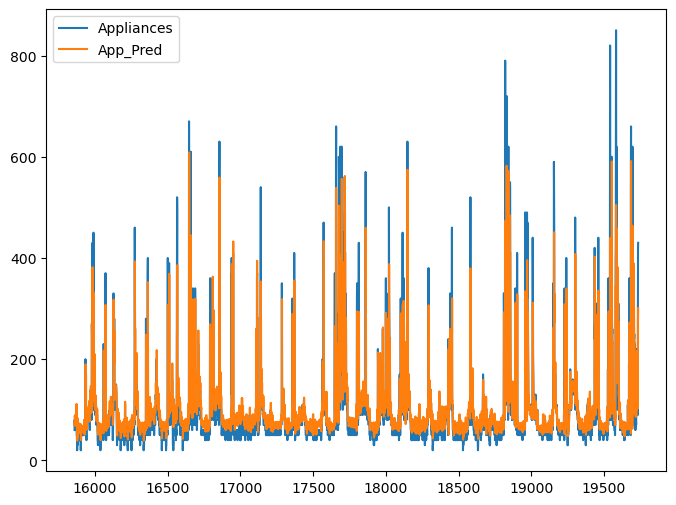

In [79]:
df_final[['Appliances', 'App_Pred']].plot()

# DeepAR and GluonTS

In [ ]:
# tbd

# Anomaly Detection

In [ ]:
# tbd

# Anomaly Detection (Isolation Forest)

In [ ]:
# tbd

# Apache Spark

In [ ]:
# tbd

# VAR

In [ ]:
# tbd

# Autoencoder

In [ ]:
# tbd

# Granger Casuality Statistical Test

In [ ]:
# tbd